# Business Problem

This is a full Guide of PROPHET Model for  GDZ Electric which supplies the Electric Energy that is an inevitable part of daily life in Izmir and Manisa with human focused service approach and modern technology systems, 2023 Datathon Competition.

Developing Prediction Approximation of Energy Distribution that is responsibled by GDZ Electric network operation is expected with Shared dateset from competitors.

Perfromance indicator is MAPE (Mean Absolute Percent Error) in Kaggle competition.

# Story of Data Set

File

● med.csv - Major Event Day Data Set

● train.csv - Train Data Set

● sample_submission.csv - Example Submission File

Details

Major Event Day (MED.CSV): The Day which is exceeded daily electric outage duration. So, we are expecting the variation in prediction of energy to be high, If outage has been done.

Energy Distribution: Watt:Active(Benefitial) power unit. MWh = MegaWatt hour

The total Energy supply distribution  of Izmir is 85% and Manisa is 15% 

If any public external data is useful for us, we can use it.

# Installation

In [11]:
pip install prophet

Note: you may need to restart the kernel to use updated packages.


# Python API

Prophet follows the sklearn model API. We create an instance of the Prophet class and then call its fit and predict methods.

The input to Prophet is always a dataframe with two columns: ds and y. 

The ds (datestamp) column should be of a format expected by Pandas, ideally YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp. 

The y column must be numeric, and represents the measurement we wish to forecast.

# Imports and Reading Data

In [12]:
import pandas as pd
from prophet import Prophet

import warnings
warnings.filterwarnings("ignore")

df = pd.read_csv('/kaggle/input/gdz-elektrik-datathon-2023/train.csv')
df.rename(columns={'Tarih':'ds', 'Dağıtılan Enerji (MWh)':'y'}, inplace=True)
df_copy = df.copy()
df.head()

,ds,y
0,2018-01-01 00:00:00,1593.944216
1,2018-01-01 01:00:00,1513.933887
2,2018-01-01 02:00:00,1402.612637
3,2018-01-01 03:00:00,1278.527266
4,2018-01-01 04:00:00,1220.697701


# First Simple Model and Fit

In [13]:
m = Prophet()
m.fit(df)

08:27:24 - cmdstanpy - INFO - Chain [1] start processing
08:28:04 - cmdstanpy - INFO - Chain [1] done processing


# Extending Days in Specified Frequency in future DataFrame

In [14]:
future = m.make_future_dataframe(periods=744, freq='H')
future

,ds
0,2018-01-01 00:00:00
1,2018-01-01 01:00:00
2,2018-01-01 02:00:00
3,2018-01-01 03:00:00
4,2018-01-01 04:00:00
...,...
40891,2022-08-31 19:00:00
40892,2022-08-31 20:00:00
40893,2022-08-31 21:00:00
40894,2022-08-31 22:00:00


# Forecasting

The predict method will assign each row in future a predicted value which it names yhat. If you pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [15]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
40891,2022-08-31 19:00:00,2381.181882,2160.781522,2591.310039
40892,2022-08-31 20:00:00,2382.611437,2163.418697,2625.368298
40893,2022-08-31 21:00:00,2344.376018,2109.730610,2572.114446
40894,2022-08-31 22:00:00,2244.832119,2017.379060,2455.424897
40895,2022-08-31 23:00:00,2096.656906,1884.903093,2305.496339


In [16]:
submission_df = forecast.loc[forecast['ds'] > '2022-07-31 23:00:00',['ds','yhat']].reset_index(drop=True)
submission_df.rename(columns={'ds':'Tarih', 'yhat':'Dağıtılan Enerji (MWh)'},inplace=True)
submission_df.set_index('Tarih', inplace=True)
submission_df.to_csv('submission_prophet_basic.csv')
submission_df

,Dağıtılan Enerji (MWh)
Tarih,
2022-08-01 00:00:00,1975.392026
2022-08-01 01:00:00,1860.131169
2022-08-01 02:00:00,1785.320974
2022-08-01 03:00:00,1735.801431
2022-08-01 04:00:00,1700.647206
...,...
2022-08-31 19:00:00,2381.181882
2022-08-31 20:00:00,2382.611437
2022-08-31 21:00:00,2344.376018


Competition MAPE score is 5.45824

# Plotting The Forecast

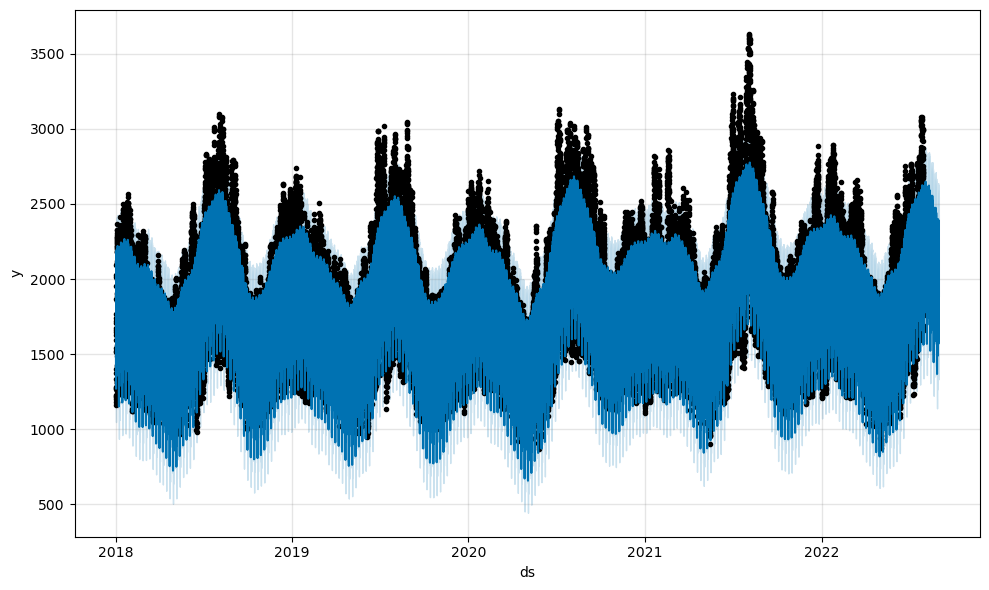

In [17]:
fig1 = m.plot(forecast)

# Plotting The Components

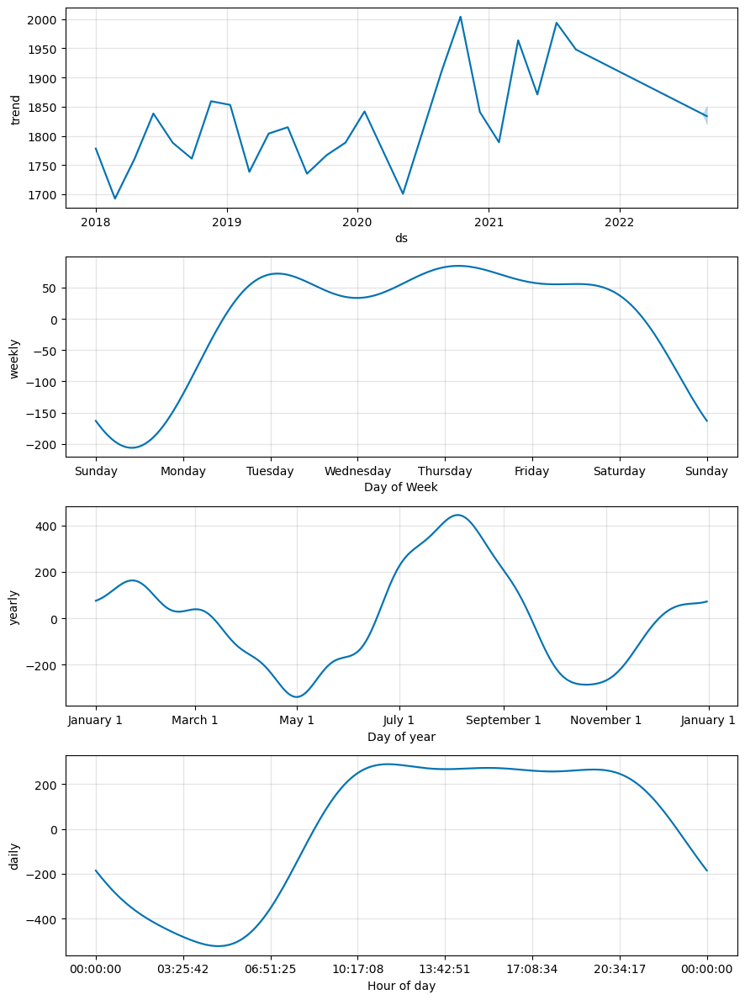

In [18]:
fig2 = m.plot_components(forecast)

In [19]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [20]:
plot_components_plotly(m, forecast)

# Trend Changepoints

By default changepoints are only inferred for the first 80% of the time series in order to have plenty of runway for projecting the trend forward and to avoid overfitting fluctuations at the end of the time series. This default works in many situations but not all, and can be changed using the changepoint_range argument. For example, m = Prophet(changepoint_range=0.9) in Python.

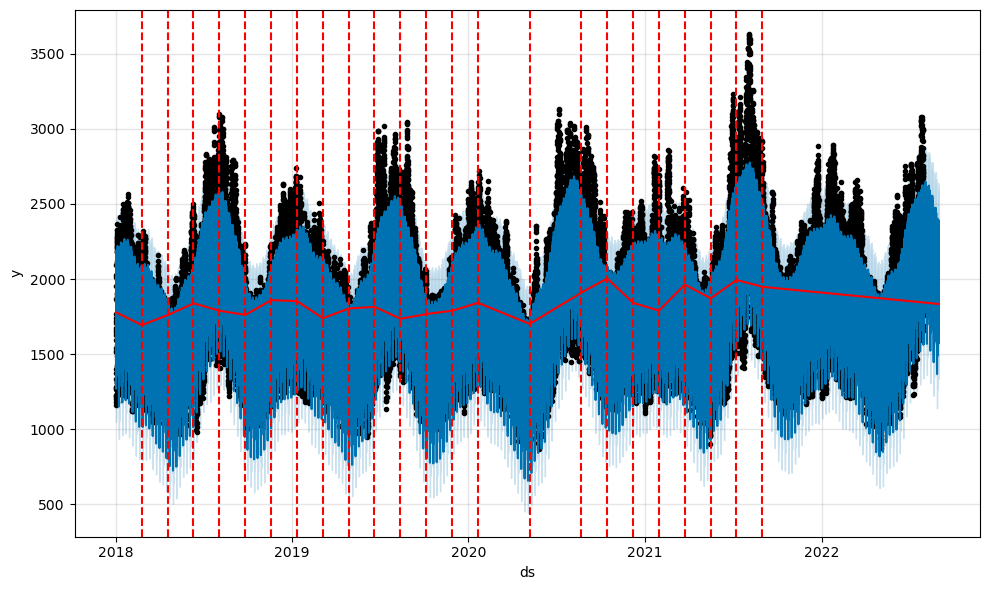

In [21]:
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

# Adjusting Trend Flexibility

08:28:29 - cmdstanpy - INFO - Chain [1] start processing
08:29:09 - cmdstanpy - INFO - Chain [1] done processing


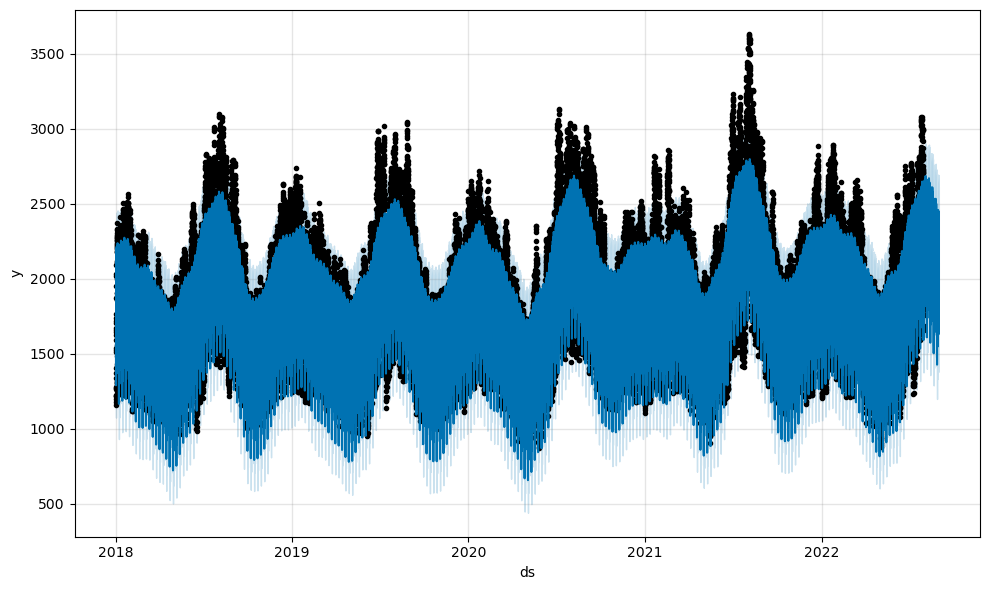

In [22]:
m = Prophet(changepoint_prior_scale=0.5)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

08:29:23 - cmdstanpy - INFO - Chain [1] start processing
08:29:43 - cmdstanpy - INFO - Chain [1] done processing


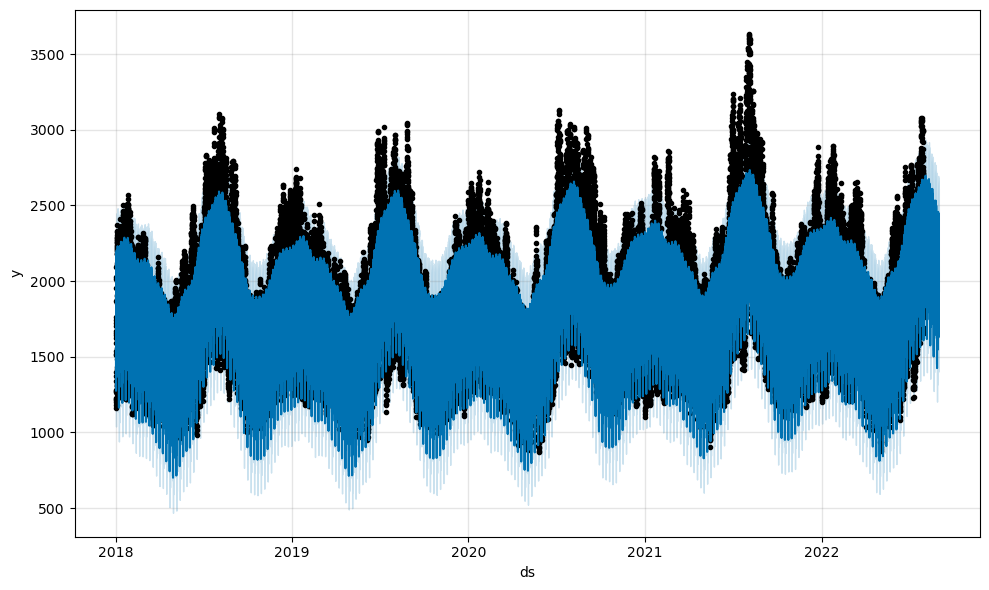

In [23]:
m = Prophet(changepoint_prior_scale=0.001)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

# Specifying The Locations of The Changepoints

08:29:57 - cmdstanpy - INFO - Chain [1] start processing
08:30:09 - cmdstanpy - INFO - Chain [1] done processing


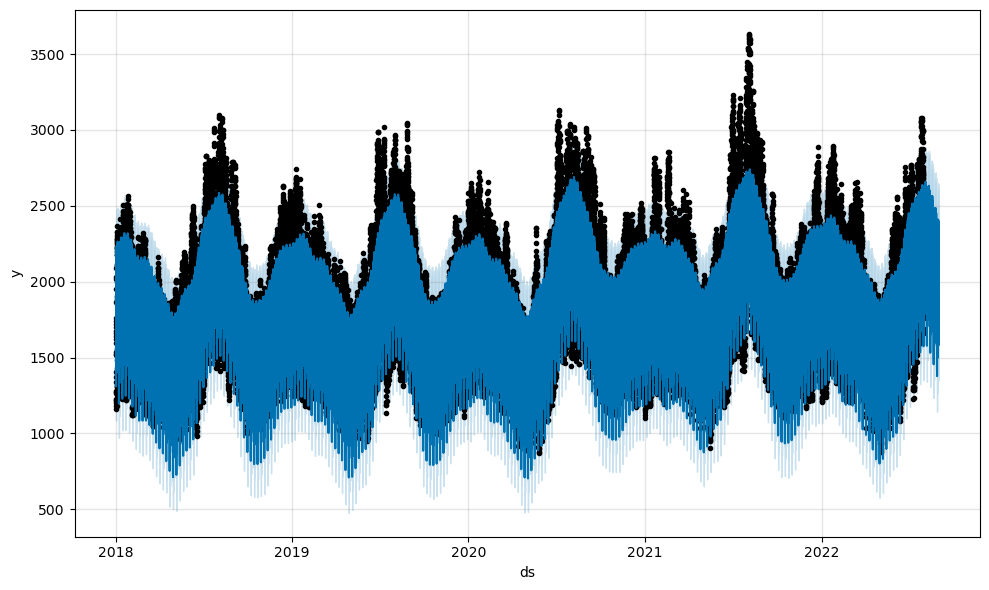

In [24]:
m = Prophet(changepoints=['2020-05-07','2020-10-13', '2020-12-10', '2021-01-29', '2021-03-23', '2021-05-18','2021-06-13'])
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

# Modeling Holidays Effects, And Regressors

If you have holidays or other recurring events that you’d like to model, you must create a dataframe for them. It has two columns (holiday and ds) and a row for each occurrence of the holiday. It must include all occurrences of the holiday, both in the past (back as far as the historical data go) and in the future (out as far as the forecast is being made). If they won’t repeat in the future, Prophet will model them and then not include them in the forecast.

You can also include columns lower_window and upper_window which extend the holiday out to [lower_window, upper_window] days around the date. For instance, if you wanted to include Christmas Eve in addition to Christmas you’d include lower_window=-1,upper_window=0. If you wanted to use Black Friday in addition to Thanksgiving, you’d include lower_window=0,upper_window=1. You can also include a column prior_scale to set the prior scale separately for each holiday, as described below.

# Adding Custom Holidays

In [25]:
new_year_holidays = pd.DataFrame({
  'holiday': 'new_year',
  'ds': pd.to_datetime(["2018-01-01","2019-01-01","2020-01-01","2021-01-01","2022-01-01"]),
  'lower_window': -1,
  'upper_window': 0,
})
ramadan_holidays = pd.DataFrame({
  'holiday': 'ramadan',
  'ds': pd.to_datetime(["2018-06-14","2018-06-15","2018-06-16","2018-06-17",
                        "2019-06-03","2019-06-04","2019-06-05","2019-06-06",
                        "2020-05-23","2020-05-24","2020-05-25","2020-05-26",
                        "2021-05-12","2021-05-13","2021-05-14","2021-05-15",
                        "2022-05-01","2022-05-02","2022-05-03","2022-05-04"]),
  'lower_window': 0,
  'upper_window': 0,
})
official_holidays = pd.DataFrame({
  'holiday': 'official_holiday',
  'ds': pd.to_datetime(["2018-04-23","2018-05-01","2018-05-19","2018-07-15","2018-08-30","2018-10-28","2018-10-29",
                        "2019-04-23","2019-05-01","2019-05-19","2019-07-15","2019-08-30","2019-10-28","2019-10-29",
                        "2020-04-23","2020-05-01","2020-05-19","2020-07-15","2020-08-30","2020-10-28","2020-10-29",
                        "2021-04-23","2021-05-01","2021-05-19","2021-07-15","2021-08-30","2021-10-28","2021-10-29",
                        "2022-04-23","2022-05-01","2022-05-19","2022-07-15","2022-08-30","2022-10-28","2022-10-29"]),
  'lower_window': 0,
  'upper_window': 0,
})
sacriface_holidays = pd.DataFrame({
  'holiday': 'sacrifice',
  'ds': pd.to_datetime(["2018-08-20","2018-08-21","2018-08-22","2018-08-23","2018-08-24",
                        "2019-08-10","2019-08-11","2019-08-12","2019-08-13","2019-08-14",
                        "2020-07-30","2020-07-31","2020-08-01","2020-08-02","2020-08-03",
                        "2021-07-19","2021-07-20","2021-07-21","2021-07-22","2021-07-23",
                        "2022-07-08","2022-07-09","2022-07-10","2022-07-11","2022-07-12"]),
  'lower_window': 0,
  'upper_window': 0,
})
holidays = pd.concat((new_year_holidays, ramadan_holidays,official_holidays,sacriface_holidays))

In [26]:
holidays

,holiday,ds,lower_window,upper_window
0,new_year,2018-01-01,-1,0
1,new_year,2019-01-01,-1,0
2,new_year,2020-01-01,-1,0
3,new_year,2021-01-01,-1,0
4,new_year,2022-01-01,-1,0
...,...,...,...,...
20,sacrifice,2022-07-08,0,0
21,sacrifice,2022-07-09,0,0
22,sacrifice,2022-07-10,0,0
23,sacrifice,2022-07-11,0,0


# New Model with Holidays and Forecasting

In [27]:
m = Prophet(holidays=holidays)
forecast = m.fit(df).predict(future)

08:30:23 - cmdstanpy - INFO - Chain [1] start processing
08:31:37 - cmdstanpy - INFO - Chain [1] done processing


# Holiday Effect on forecast DataFrame

In [28]:
forecast[(forecast['ramadan'] + forecast['official_holiday']).abs() > 0][
        ['ds', 'ramadan', 'official_holiday']][-10:]

,ds,ramadan,official_holiday
40862,2022-08-30 14:00:00,0.0,-80.154296
40863,2022-08-30 15:00:00,0.0,-80.154296
40864,2022-08-30 16:00:00,0.0,-80.154296
40865,2022-08-30 17:00:00,0.0,-80.154296
40866,2022-08-30 18:00:00,0.0,-80.154296
40867,2022-08-30 19:00:00,0.0,-80.154296
40868,2022-08-30 20:00:00,0.0,-80.154296
40869,2022-08-30 21:00:00,0.0,-80.154296
40870,2022-08-30 22:00:00,0.0,-80.154296
40871,2022-08-30 23:00:00,0.0,-80.154296


# Plot Components with Holiday Effect

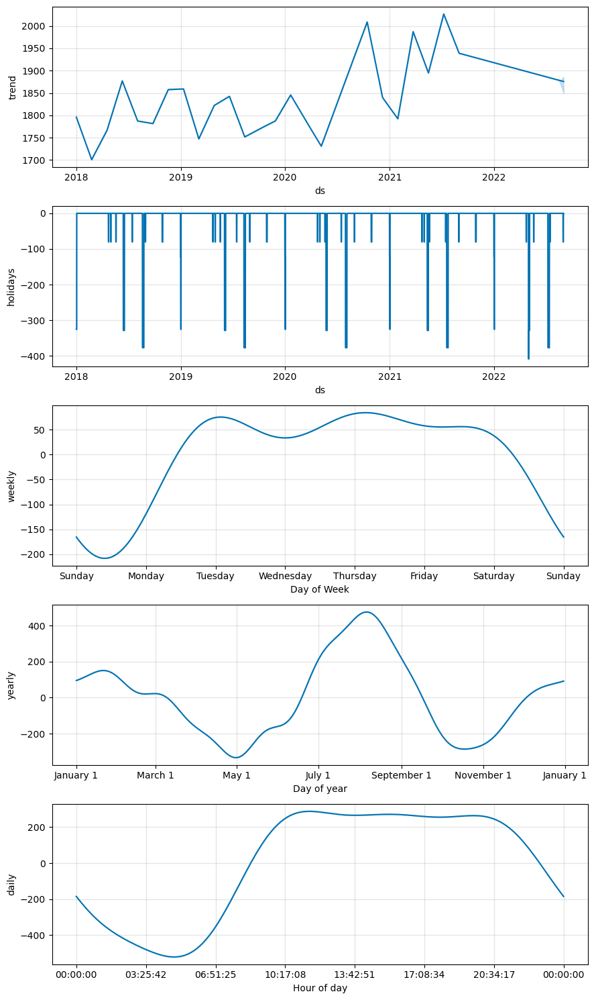

In [29]:
fig = m.plot_components(forecast)

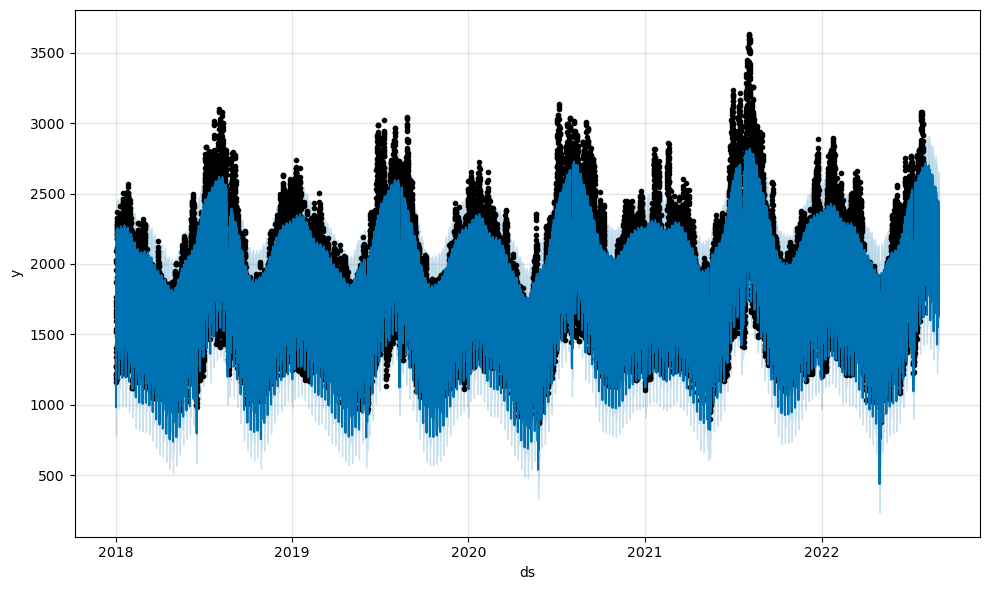

In [30]:
fig = m.plot(forecast)

In [31]:
submission_df = forecast.loc[forecast['ds'] > '2022-07-31 23:00:00',['ds','yhat']].reset_index(drop=True)
submission_df.rename(columns={'ds':'Tarih', 'yhat':'Dağıtılan Enerji (MWh)'},inplace=True)
submission_df.set_index('Tarih', inplace=True)
submission_df.to_csv('submission_prophet_w_holidays.csv')
submission_df

,Dağıtılan Enerji (MWh)
Tarih,
2022-08-01 00:00:00,2039.515846
2022-08-01 01:00:00,1924.520581
2022-08-01 02:00:00,1849.968631
2022-08-01 03:00:00,1800.699015
2022-08-01 04:00:00,1765.786820
...,...
2022-08-31 19:00:00,2434.131510
2022-08-31 20:00:00,2435.442056
2022-08-31 21:00:00,2397.089230


# Built-in Country Holidays

In [32]:
m = Prophet()
m.add_country_holidays(country_name='TR')
m.fit(df)

08:31:53 - cmdstanpy - INFO - Chain [1] start processing
08:32:56 - cmdstanpy - INFO - Chain [1] done processing


In [33]:
m.train_holiday_names

0                                     New Year's Day
1            National Sovereignty and Children's Day
2                                         Labour Day
3     Commemoration of Ataturk, Youth and Sports Day
4                   Democracy and National Unity Day
5                                        Victory Day
6                                       Republic Day
7                                      Ramadan Feast
8                              Ramadan Feast Holiday
9                                    Sacrifice Feast
10                           Sacrifice Feast Holiday
dtype: object

# Plot Components with Built-in Holiday Effect

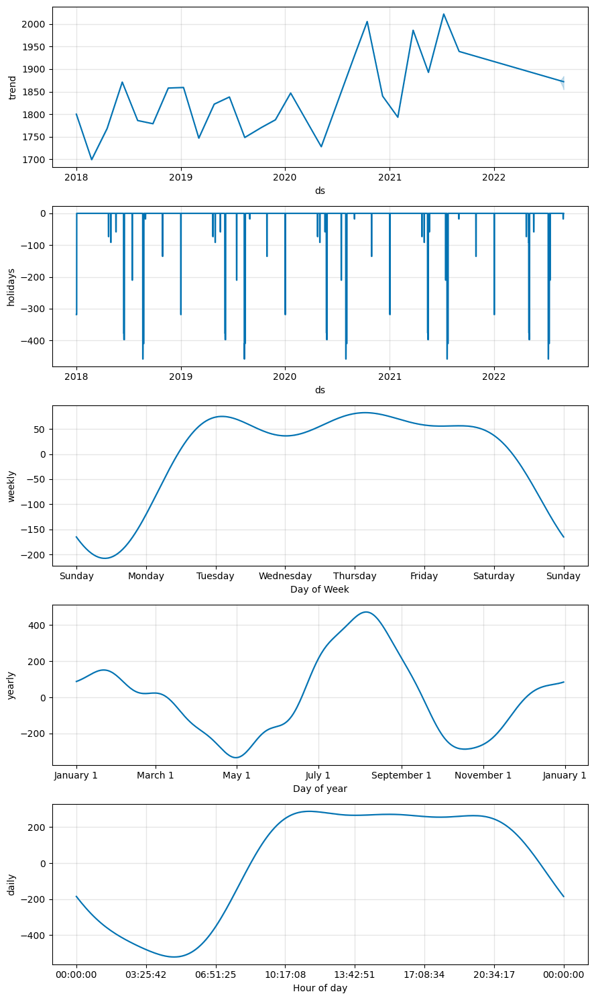

In [34]:
forecast = m.predict(future)
fig = m.plot_components(forecast)

In [35]:
submission_df = forecast.loc[forecast['ds'] > '2022-07-31 23:00:00',['ds','yhat']].reset_index(drop=True)
submission_df.rename(columns={'ds':'Tarih', 'yhat':'Dağıtılan Enerji (MWh)'},inplace=True)
submission_df.set_index('Tarih', inplace=True)
submission_df.to_csv('submission_prophet_w_holidays.csv')
submission_df

,Dağıtılan Enerji (MWh)
Tarih,
2022-08-01 00:00:00,2033.784864
2022-08-01 01:00:00,1918.615121
2022-08-01 02:00:00,1843.894945
2022-08-01 03:00:00,1794.465198
2022-08-01 04:00:00,1759.402707
...,...
2022-08-31 19:00:00,2428.699616
2022-08-31 20:00:00,2429.847752
2022-08-31 21:00:00,2391.347225


# Fourier Order for Seasonalities

The number of terms in the partial sum (the order) is a parameter that determines how quickly the seasonality can change. The default Fourier order for yearly seasonality is 10, which produces this fit:

08:33:11 - cmdstanpy - INFO - Chain [1] start processing
08:33:52 - cmdstanpy - INFO - Chain [1] done processing


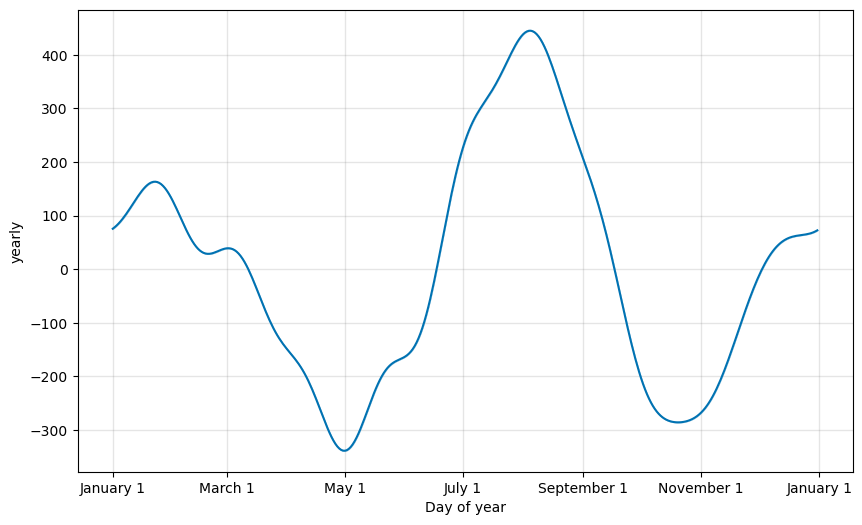

In [36]:
from prophet.plot import plot_yearly
m = Prophet().fit(df)
a = plot_yearly(m)

The default values are often appropriate, but they can be increased when the seasonality needs to fit higher-frequency changes, and generally be less smooth. The Fourier order can be specified for each built-in seasonality when instantiating the model, here it is increased to 20:

08:33:58 - cmdstanpy - INFO - Chain [1] start processing
08:34:41 - cmdstanpy - INFO - Chain [1] done processing


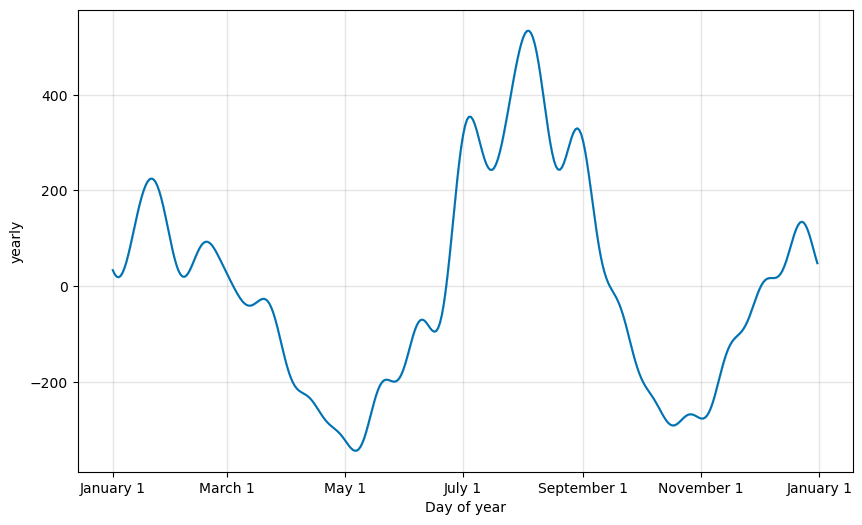

In [37]:
from prophet.plot import plot_yearly
m = Prophet(yearly_seasonality=20).fit(df)
a = plot_yearly(m)

Increasing the number of Fourier terms allows the seasonality to fit faster changing cycles, but can also lead to overfitting: N Fourier terms corresponds to 2N variables used for modeling the cycle

# Specifying Custom Seasonalities

Prophet will by default fit weekly and yearly seasonalities, if the time series is more than two cycles long. It will also fit daily seasonality for a sub-daily time series. You can add other seasonalities (monthly, quarterly, hourly) using the add_seasonality method (Python)

The inputs to this function are a name, the period of the seasonality in days, and the Fourier order for the seasonality. For reference, by default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality. An optional input to add_seasonality is the prior scale for that seasonal component - this is discussed below.

08:34:46 - cmdstanpy - INFO - Chain [1] start processing
08:35:21 - cmdstanpy - INFO - Chain [1] done processing


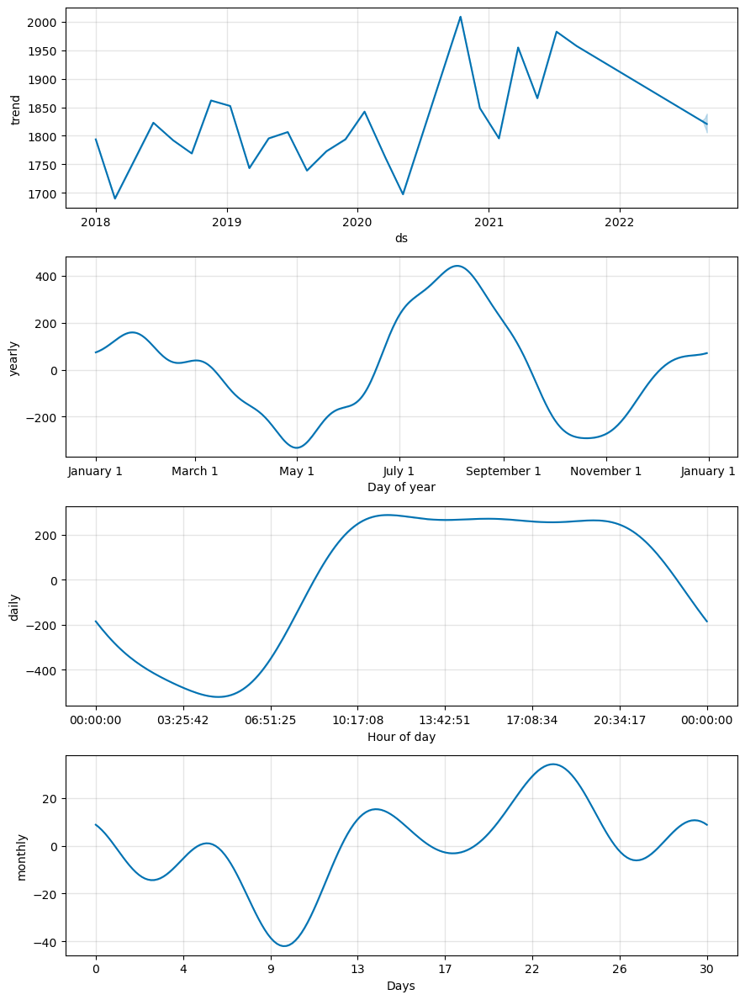

In [38]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
forecast = m.fit(df).predict(future)
fig = m.plot_components(forecast)

# Sesonalities that Depend On Other Factors

In some instances the seasonality may depend on other factors, such as a weekly seasonal pattern that is different during the summer than it is during the rest of the year, or a daily seasonal pattern that is different on weekends vs. on weekdays. These types of seasonalities can be modeled using conditional seasonalities.

In [39]:
df = df_copy
def is_AC_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 5 and date.month < 9)

df['on_season'] = df['ds'].apply(is_AC_season)
df['off_season'] = ~df['ds'].apply(is_AC_season)

In [40]:
df

,ds,y,on_season,off_season
0,2018-01-01 00:00:00,1593.944216,False,True
1,2018-01-01 01:00:00,1513.933887,False,True
2,2018-01-01 02:00:00,1402.612637,False,True
3,2018-01-01 03:00:00,1278.527266,False,True
4,2018-01-01 04:00:00,1220.697701,False,True
...,...,...,...,...
40147,2022-07-31 19:00:00,2492.489498,True,False
40148,2022-07-31 20:00:00,2479.958245,True,False
40149,2022-07-31 21:00:00,2485.016884,True,False
40150,2022-07-31 22:00:00,2396.574255,True,False


Then we disable the built-in weekly seasonality, and replace it with two weekly seasonalities that have these columns specified as a condition. This means that the seasonality will only be applied to dates where the condition_name column is True. We must also add the column to the future dataframe for which we are making predictions.

08:35:44 - cmdstanpy - INFO - Chain [1] start processing
08:36:37 - cmdstanpy - INFO - Chain [1] done processing


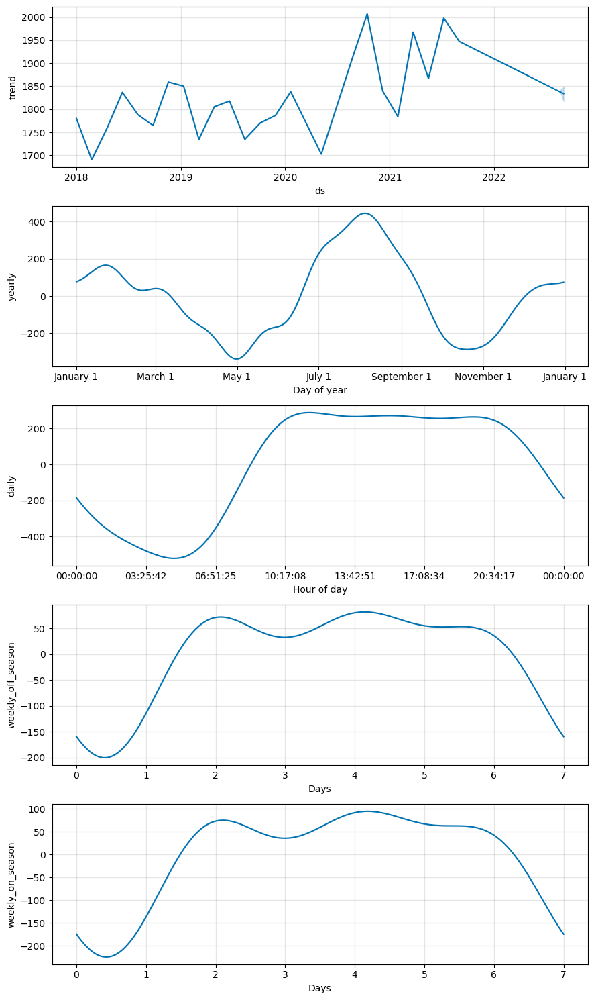

In [41]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
m.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

future['on_season'] = future['ds'].apply(is_AC_season)
future['off_season'] = ~future['ds'].apply(is_AC_season)
forecast = m.fit(df).predict(future)
fig = m.plot_components(forecast)

# Prior Scale for Holidays and Seasonality

If you find that the holidays are overfitting, you can adjust their prior scale to smooth them using the parameter holidays_prior_scale. By default this parameter is 10, which provides very little regularization. Reducing this parameter dampens holiday effects:

In [42]:
m = Prophet(holidays=holidays, holidays_prior_scale=0.05).fit(df)
forecast = m.predict(future)
forecast[(forecast['ramadan'] + forecast['official_holiday']).abs() > 0][
        ['ds', 'ramadan', 'official_holiday']][-10:]

08:36:52 - cmdstanpy - INFO - Chain [1] start processing
08:37:52 - cmdstanpy - INFO - Chain [1] done processing


,ds,ramadan,official_holiday
40862,2022-08-30 14:00:00,0.0,-80.261836
40863,2022-08-30 15:00:00,0.0,-80.261836
40864,2022-08-30 16:00:00,0.0,-80.261836
40865,2022-08-30 17:00:00,0.0,-80.261836
40866,2022-08-30 18:00:00,0.0,-80.261836
40867,2022-08-30 19:00:00,0.0,-80.261836
40868,2022-08-30 20:00:00,0.0,-80.261836
40869,2022-08-30 21:00:00,0.0,-80.261836
40870,2022-08-30 22:00:00,0.0,-80.261836
40871,2022-08-30 23:00:00,0.0,-80.261836


There is a parameter seasonality_prior_scale which similarly adjusts the extent to which the seasonality model will fit the data.

Prior scales can be set separately for individual holidays by including a column prior_scale in the holidays dataframe. Prior scales for individual seasonalities can be passed as an argument to add_seasonality. For instance, the prior scale for just weekly seasonality can be set using:

In [43]:
m = Prophet()
m.add_seasonality(
    name='weekly', period=7, fourier_order=3, prior_scale=0.1)

# Additional Regressor

Additional regressors can be added to the linear part of the model using the add_regressor method or function. A column with the regressor value will need to be present in both the fitting and prediction dataframes. 

08:38:09 - cmdstanpy - INFO - Chain [1] start processing
08:39:14 - cmdstanpy - INFO - Chain [1] done processing


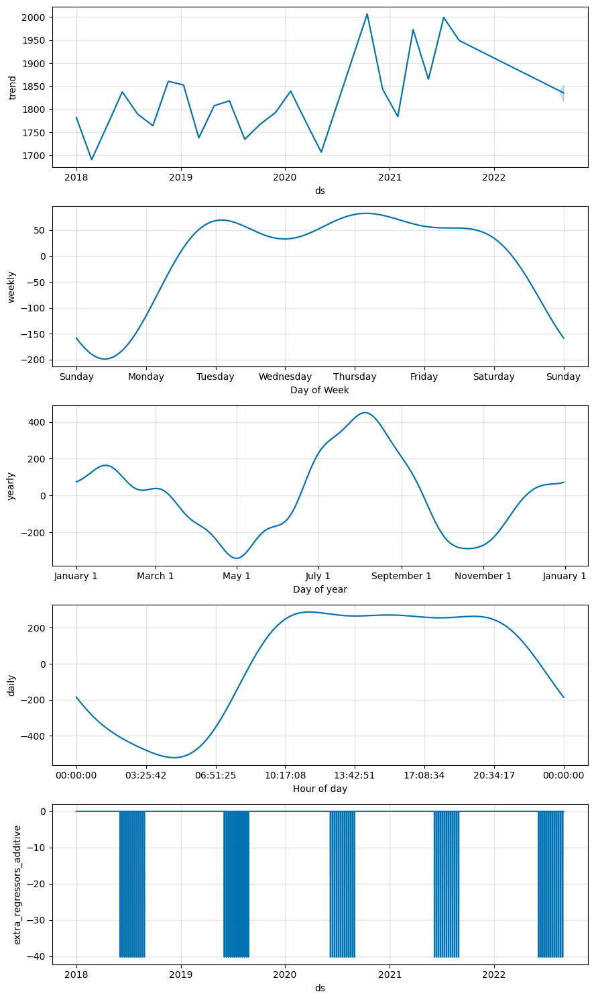

In [44]:
def is_summer_sunday(ds):
    date = pd.to_datetime(ds)
    if date.weekday() == 6 and (date.month > 5 and date.month < 9):
        return 1
    else:
        return 0
df['is_summer_sunday'] = df['ds'].apply(is_summer_sunday)

m = Prophet()
m.add_regressor('is_summer_sunday')
m.fit(df)

future['is_summer_sunday'] = future['ds'].apply(is_summer_sunday)

forecast = m.predict(future)
fig = m.plot_components(forecast)

The add_regressor function provides a more general interface for defining extra linear regressors, and in particular does not require that the regressor be a binary indicator. Another time series could be used as a regressor, although its future values would have to be known.

The extra regressor must be known for both the history and for future dates. 

For instance, if r(t) is included as a regressor for y(t), Prophet can be used to forecast r(t) and then that forecast can be plugged in as the future values when forecasting y(t). A note of caution around this approach: This will probably not be useful unless r(t) is somehow easier to forecast then y(t). This is because error in the forecast of r(t) will produce error in the forecast of y(t). One setting where this can be useful is in hierarchical time series, where there is top-level forecast that has higher signal-to-noise and is thus easier to forecast. Its forecast can be included in the forecast for each lower-level series.

Extra regressors are put in the linear component of the model, so the underlying model is that the time series depends on the extra regressor as either an additive or multiplicative factor (see the next section for multiplicativity).

If mcmc_samples is specified, a credible interval for each coefficient is also returned, which can help identify whether each regressor is “statistically significant”.

# Multiplicative Seasonality

By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. This time series of energy distribution is an example of when additive seasonality does not work:

08:39:29 - cmdstanpy - INFO - Chain [1] start processing
08:40:11 - cmdstanpy - INFO - Chain [1] done processing


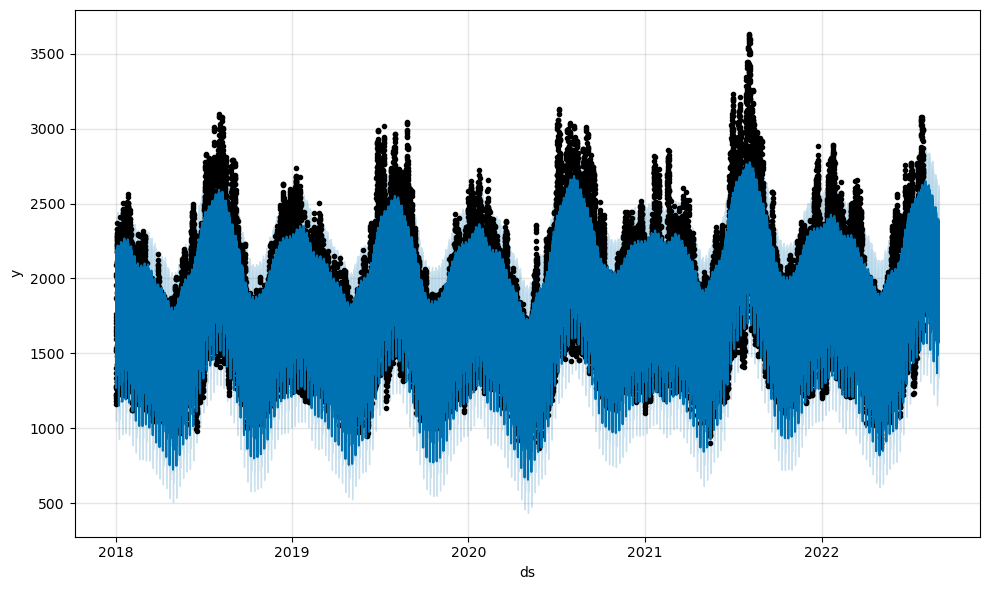

In [45]:
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(744, freq='H')
forecast = m.predict(future)
fig = m.plot(forecast)

Prophet can model multiplicative seasonality by setting seasonality_mode='multiplicative' in the input arguments:

08:40:25 - cmdstanpy - INFO - Chain [1] start processing
08:41:27 - cmdstanpy - INFO - Chain [1] done processing


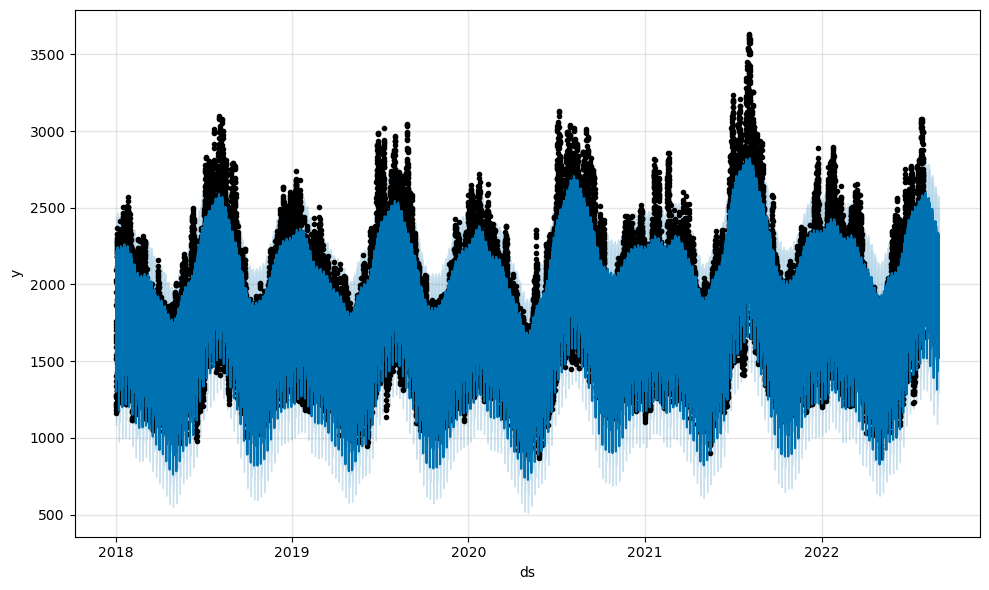

In [46]:
m = Prophet(seasonality_mode='multiplicative')
m.fit(df)
forecast = m.predict(future)
fig = m.plot(forecast)

The components figure will now show the seasonality as a percent of the trend:

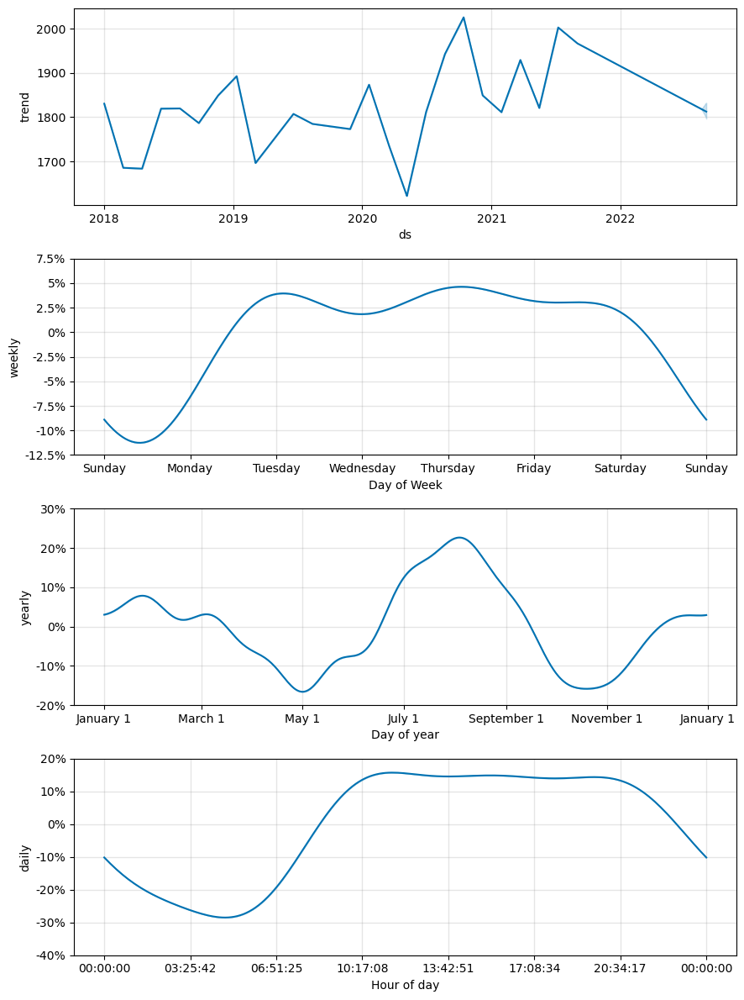

In [47]:
fig = m.plot_components(forecast)

With seasonality_mode='multiplicative', holiday effects will also be modeled as multiplicative. Any added seasonalities or extra regressors will by default use whatever seasonality_mode is set to, but can be overridden by specifying mode='additive' or mode='multiplicative' as an argument when adding the seasonality or regressor.

For example, this block sets the built-in seasonalities to multiplicative, but includes an additive quarterly seasonality and an additive regressor:

In [48]:
m = Prophet(seasonality_mode='multiplicative')
m.add_seasonality('quarterly', period=91.25, fourier_order=8, mode='additive')
m.add_regressor('regressor', mode='additive')

Additive and multiplicative extra regressors will show up in separate panels on the components plot. Note, however, that it is pretty unlikely to have a mix of additive and multiplicative seasonalities, so this will generally only be used if there is a reason to expect that to be the case

# Uncertainty Intervals

By default Prophet will return uncertainty intervals for the forecast yhat. There are several important assumptions behind these uncertainty intervals.

There are three sources of uncertainty in the forecast: uncertainty in the trend, uncertainty in the seasonality estimates, and additional observation noise.

# Uncertainty in The Trend

he biggest source of uncertainty in the forecast is the potential for future trend changes. The time series we have seen already in this documentation show clear trend changes in the history. Prophet is able to detect and fit these, but what trend changes should we expect moving forward? It’s impossible to know for sure, so we do the most reasonable thing we can, and we assume that the future will see similar trend changes as the history. In particular, we assume that the average frequency and magnitude of trend changes in the future will be the same as that which we observe in the history. We project these trend changes forward and by computing their distribution we obtain uncertainty intervals.

One property of this way of measuring uncertainty is that allowing higher flexibility in the rate, by increasing changepoint_prior_scale, will increase the forecast uncertainty. This is because if we model more rate changes in the history then we will expect more in the future, and makes the uncertainty intervals a useful indicator of overfitting.

The width of the uncertainty intervals (by default 80%) can be set using the parameter interval_width:

In [49]:
forecast = Prophet(interval_width=0.95).fit(df).predict(future)

08:41:43 - cmdstanpy - INFO - Chain [1] start processing
08:42:29 - cmdstanpy - INFO - Chain [1] done processing


Again, these intervals assume that the future will see the same frequency and magnitude of rate changes as the past. This assumption is probably not true, so you should not expect to get accurate coverage on these uncertainty intervals.

# Uncertainty in Seasonality

By default Prophet will only return uncertainty in the trend and observation noise. To get uncertainty in seasonality, you must do full Bayesian sampling. This is done using the parameter mcmc.samples (which defaults to 0). We do this here for the first months.

In [50]:
m = Prophet(mcmc_samples=50)
forecast = m.fit(df, show_progress=False).predict(future)

08:42:41 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
08:42:41 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
08:42:41 - cmdstanpy - INFO - CmdStan start processing
08:42:41 - cmdstanpy - INFO - Chain [1] start processing
08:42:41 - cmdstanpy - INFO - Chain [2] start processing
08:42:41 - cmdstanpy - INFO - Chain [4] start processing
08:42:41 - cmdstanpy - INFO - Chain [3] start processing
08:42:54 - cmdstanpy - INFO - Chain [4] done processing
08:42:54 - cmdstanpy - INFO - Chain [2] done processing
08:42:56 - cmdstanpy - INFO - Chain [1] done processing
08:42:59 - cmdstanpy - INFO - Chain [3] done processing
08:42:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

This replaces the typical MAP estimation with MCMC sampling, and can take much longer depending on how many observations there are - expect several minutes instead of several seconds. If you do full sampling, then you will see the uncertainty in seasonal components when you plot them:

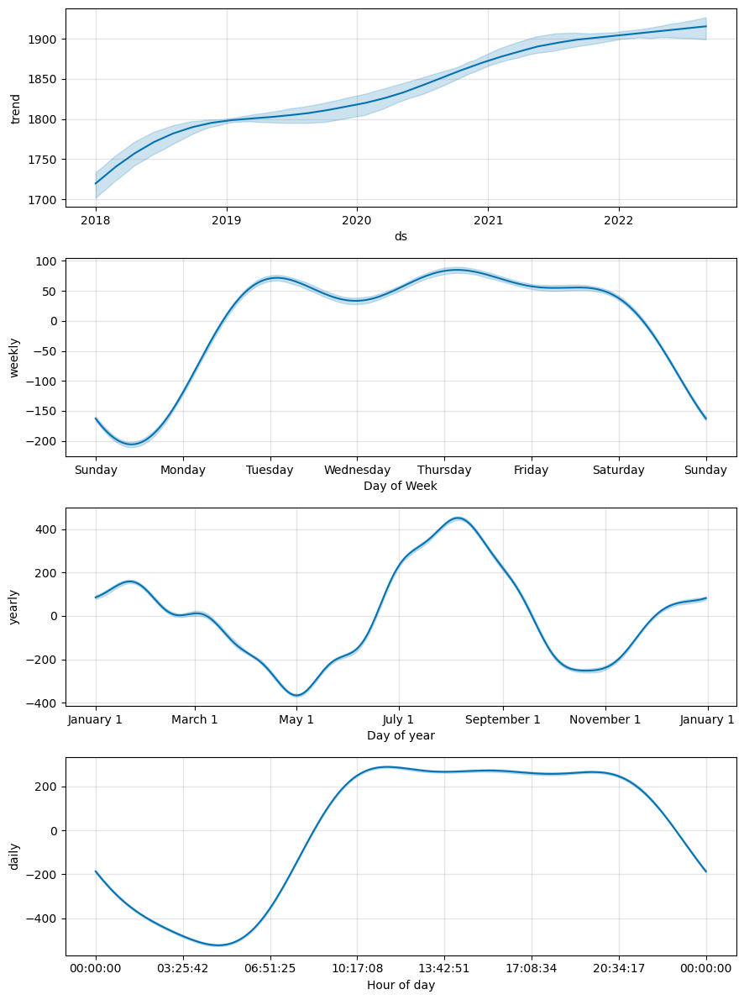

In [51]:
fig = m.plot_components(forecast)

You can access the raw posterior predictive samples in Python using the method m.predictive_samples(future)

08:43:21 - cmdstanpy - INFO - Chain [1] start processing
08:44:03 - cmdstanpy - INFO - Chain [1] done processing


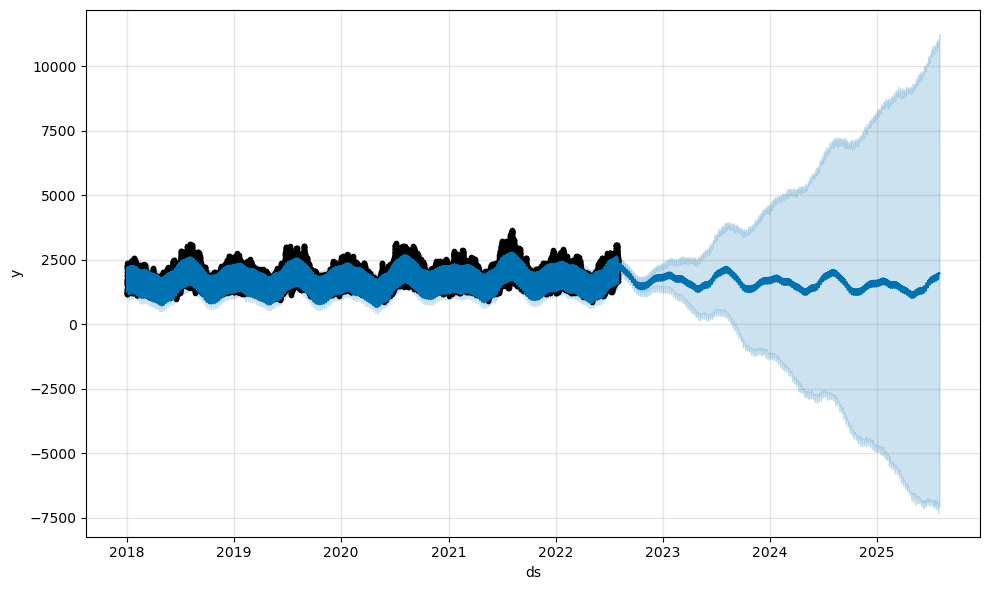

In [52]:
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast)

# Outliers

There are two main ways that outliers can affect Prophet forecasts.

08:44:16 - cmdstanpy - INFO - Chain [1] start processing
08:44:56 - cmdstanpy - INFO - Chain [1] done processing


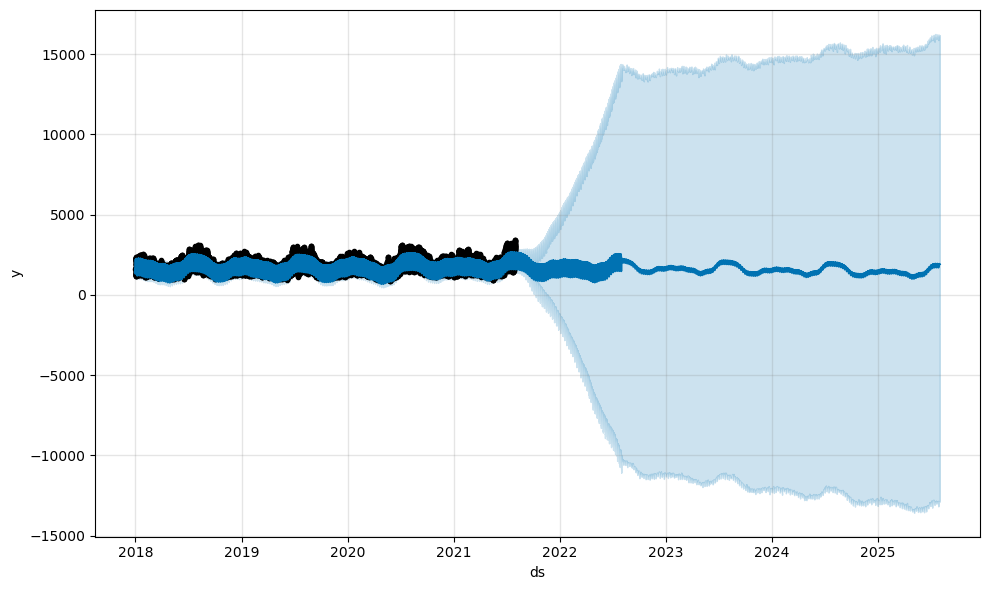

In [53]:
df.loc[(df['ds'] > '2021-07-31') & (df['ds'] < '2022-09-01'), 'y'] = None
model = Prophet().fit(df)
fig = model.plot(model.predict(future))

The trend forecast seems reasonable, but the uncertainty intervals seem way too wide. Prophet is able to handle the outliers in the history, but only by fitting them with trend changes. The uncertainty model then expects future trend changes of similar magnitude.

The best way to handle outliers is to remove them - Prophet has no problem with missing data. If you set their values to NA in the history but leave the dates in future, then Prophet will give you a prediction for their values.

08:45:10 - cmdstanpy - INFO - Chain [1] start processing
08:45:51 - cmdstanpy - INFO - Chain [1] done processing


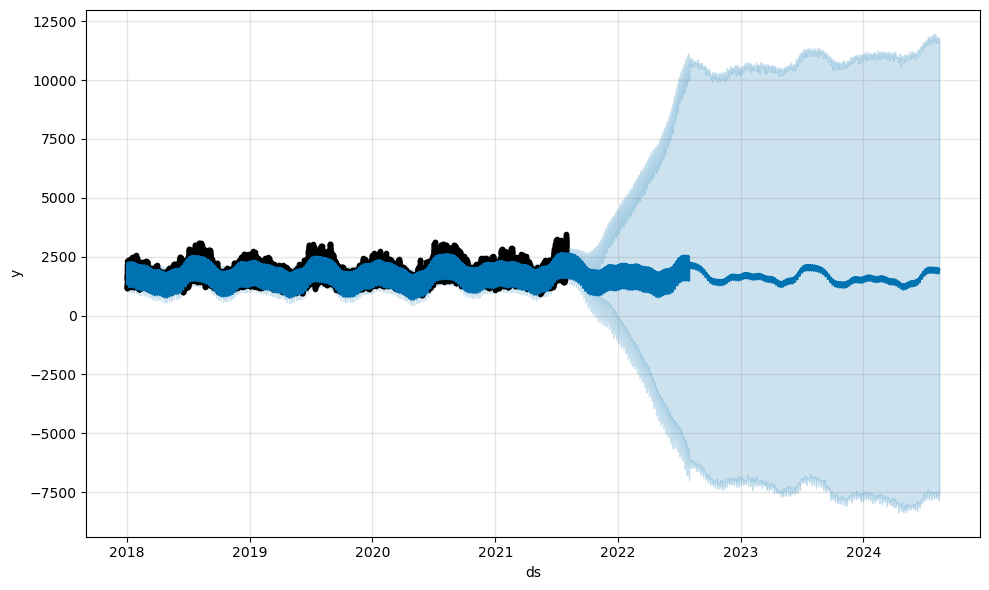

In [54]:
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=744)
forecast = m.predict(future)
fig = m.plot(forecast)

08:46:04 - cmdstanpy - INFO - Chain [1] start processing
08:46:32 - cmdstanpy - INFO - Chain [1] done processing


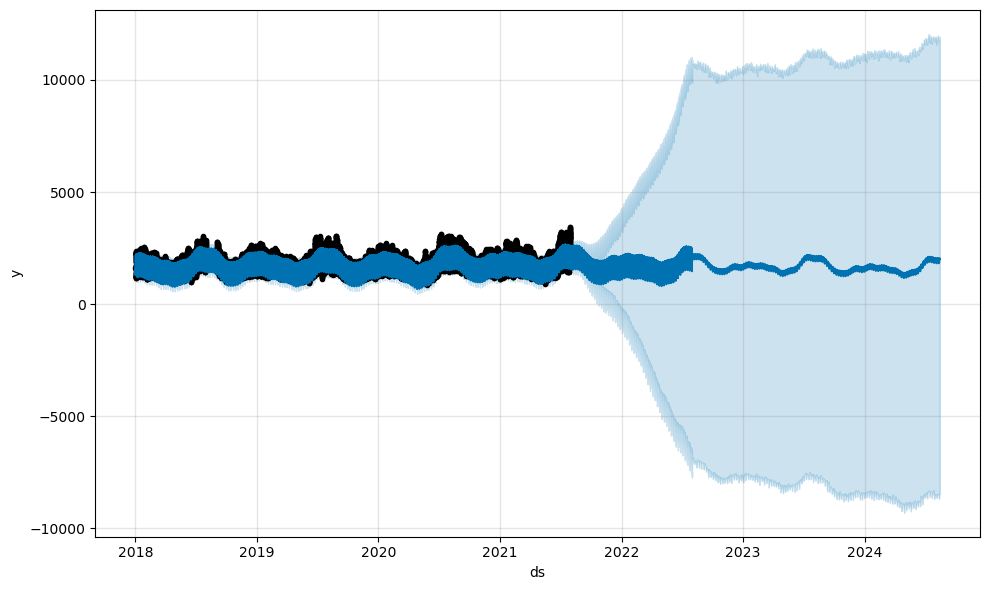

In [55]:
df.loc[(df['ds'] > '2018-07-31') & (df['ds'] < '2018-09-01'), 'y'] = None
m = Prophet().fit(df)
fig = m.plot(m.predict(future))

# Non-Daily Data

## Sub-daily data

Prophet can make forecasts for time series with sub-daily observations by passing in a dataframe with timestamps in the ds column. The format of the timestamps should be YYYY-MM-DD HH:MM:SS. When sub-daily data are used, daily seasonality will automatically be fit.

08:46:45 - cmdstanpy - INFO - Chain [1] start processing
08:47:07 - cmdstanpy - INFO - Chain [1] done processing


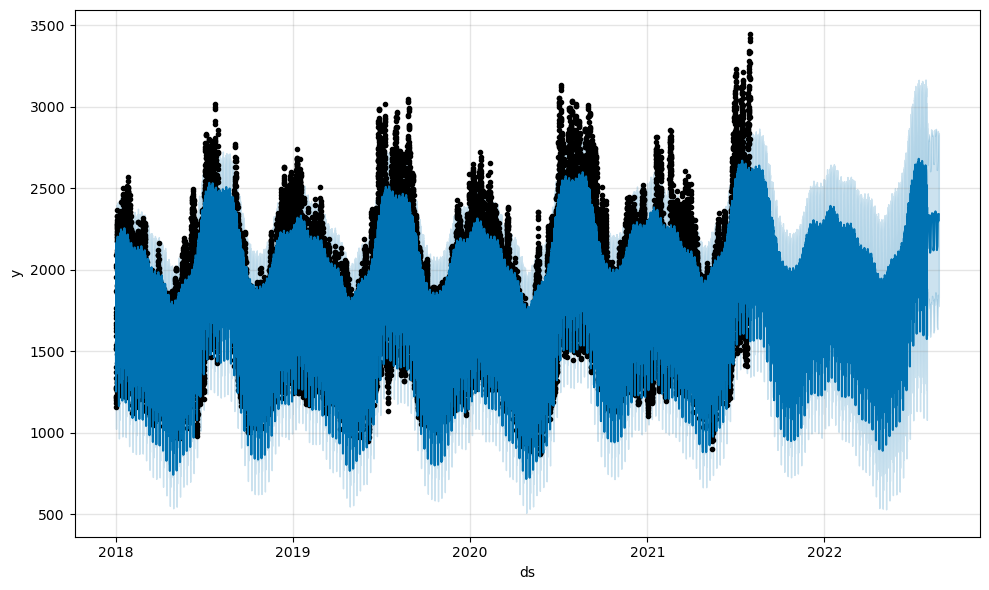

In [56]:
m = Prophet(changepoint_prior_scale=0.01).fit(df)
future = m.make_future_dataframe(periods=24, freq='D')
fcst = m.predict(future)
fig = m.plot(fcst)

The daily seasonality will show up in the components plot:

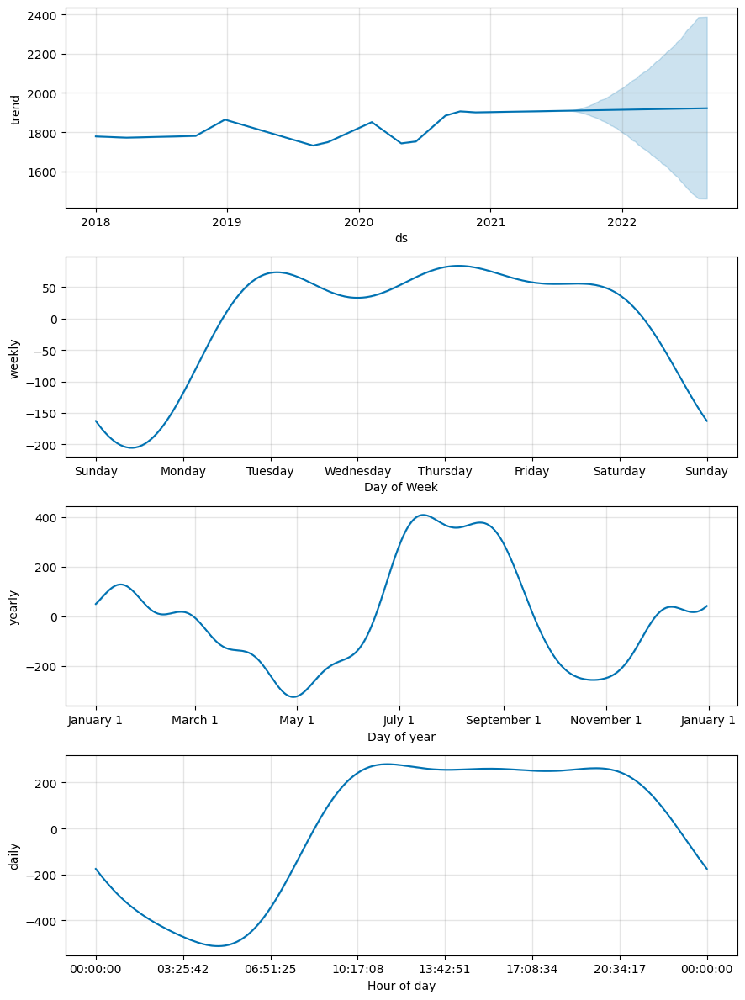

In [57]:
fig = m.plot_components(fcst)

# Data with Regular Gaps

Suppose the dataset above only had observations from 12a to 6a:

08:47:20 - cmdstanpy - INFO - Chain [1] start processing
08:47:25 - cmdstanpy - INFO - Chain [1] done processing


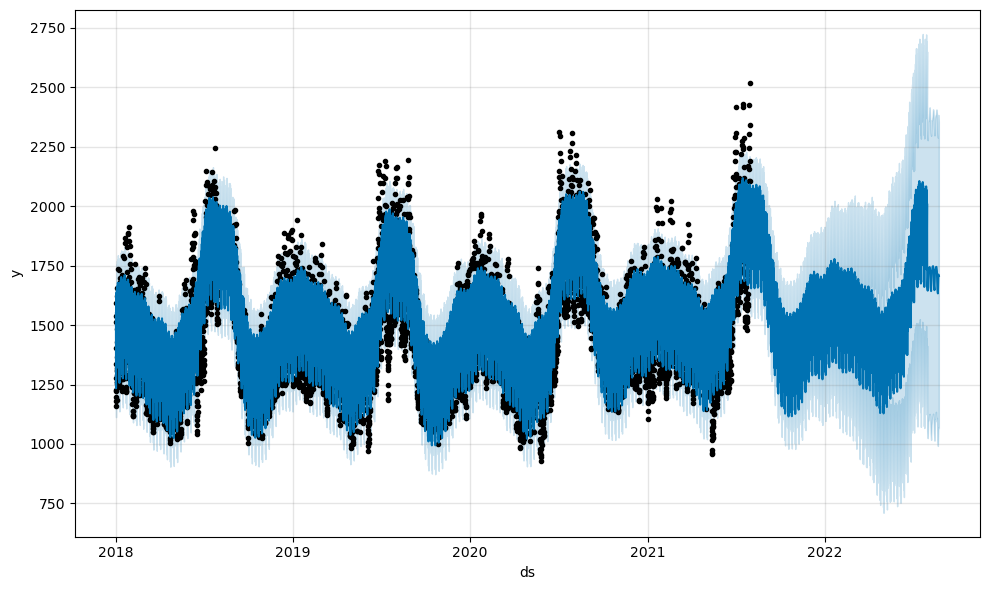

In [58]:
df2 = df.copy()
df2['ds'] = pd.to_datetime(df2['ds'])
df2 = df2[df2['ds'].dt.hour < 6]
m = Prophet().fit(df2)
future = m.make_future_dataframe(periods=24, freq='D')
fcst = m.predict(future)
fig = m.plot(fcst)

The forecast seems quite poor, with much larger fluctuations in the future than were seen in the history. The issue here is that we have fit a daily cycle to a time series that only has data for part of the day (12a to 6a). The daily seasonality is thus unconstrained for the remainder of the day and is not estimated well. The solution is to only make predictions for the time windows for which there are historical data. Here, that means to limit the future dataframe to have times from 12a to 6a:

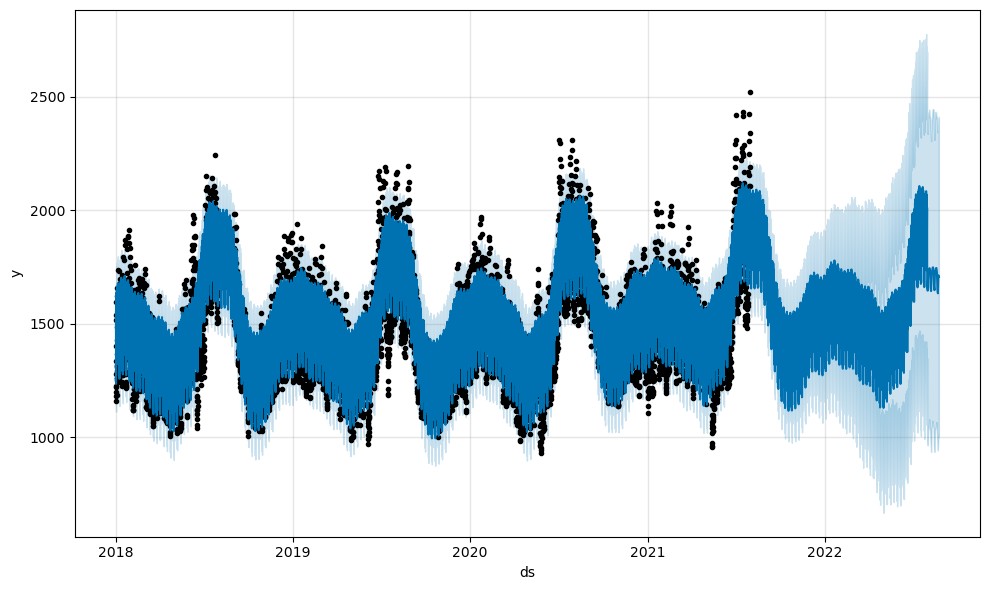

In [59]:
future2 = future.copy()
future2 = future2[future2['ds'].dt.hour < 6]
fcst = m.predict(future2)
fig = m.plot(fcst)

The same principle applies to other datasets with regular gaps in the data. For example, if the history contains only weekdays, then predictions should only be made for weekdays since the weekly seasonality will not be well estimated for the weekends.

# Monthly Data

You can use Prophet to fit monthly data. However, the underlying model is continuous-time, which means that you can get strange results if you fit the model to monthly data and then ask for daily forecasts.

08:47:34 - cmdstanpy - INFO - Chain [1] start processing
08:48:11 - cmdstanpy - INFO - Chain [1] done processing


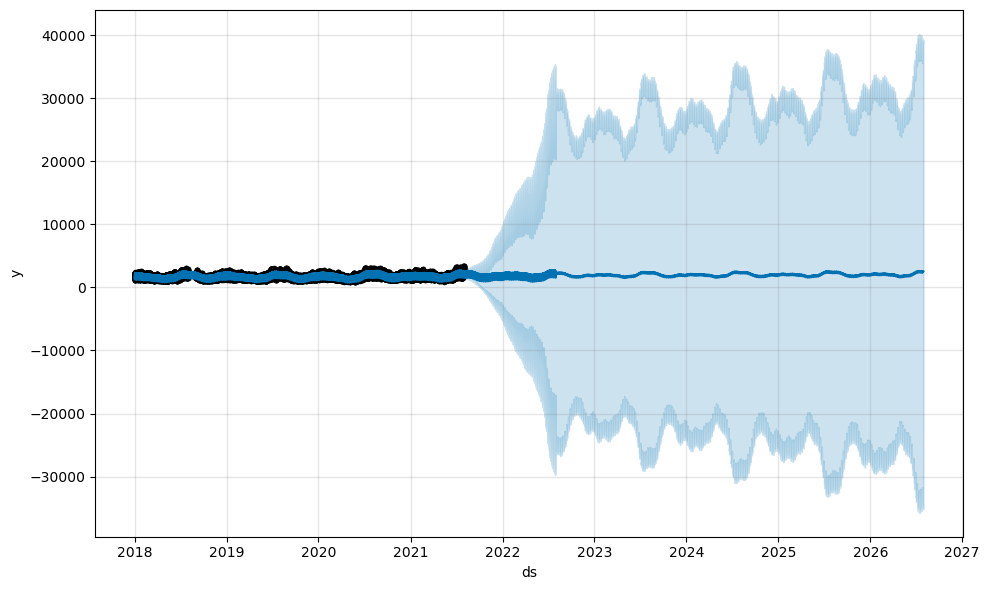

In [60]:
m = Prophet(seasonality_mode='multiplicative').fit(df)
future = m.make_future_dataframe(periods=1460)
fcst = m.predict(future)
fig = m.plot(fcst)

This is the same issue from above where the dataset has regular gaps. When we fit the yearly seasonality, it only has data for the first of each month and the seasonality components for the remaining days are unidentifiable and overfit. This can be clearly seen by doing MCMC to see uncertainty in the seasonality:

08:48:25 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
08:48:25 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
08:48:25 - cmdstanpy - INFO - CmdStan start processing
08:48:25 - cmdstanpy - INFO - Chain [1] start processing
08:48:25 - cmdstanpy - INFO - Chain [2] start processing
08:48:25 - cmdstanpy - INFO - Chain [3] start processing
08:48:25 - cmdstanpy - INFO - Chain [4] start processing
08:48:34 - cmdstanpy - INFO - Chain [3] done processing
08:48:34 - cmdstanpy - INFO - Chain [4] done processing
08:48:36 - cmdstanpy - INFO - Chain [2] done processing
08:48:39 - cmdstanpy - INFO - Chain [1] done processing
08:48:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

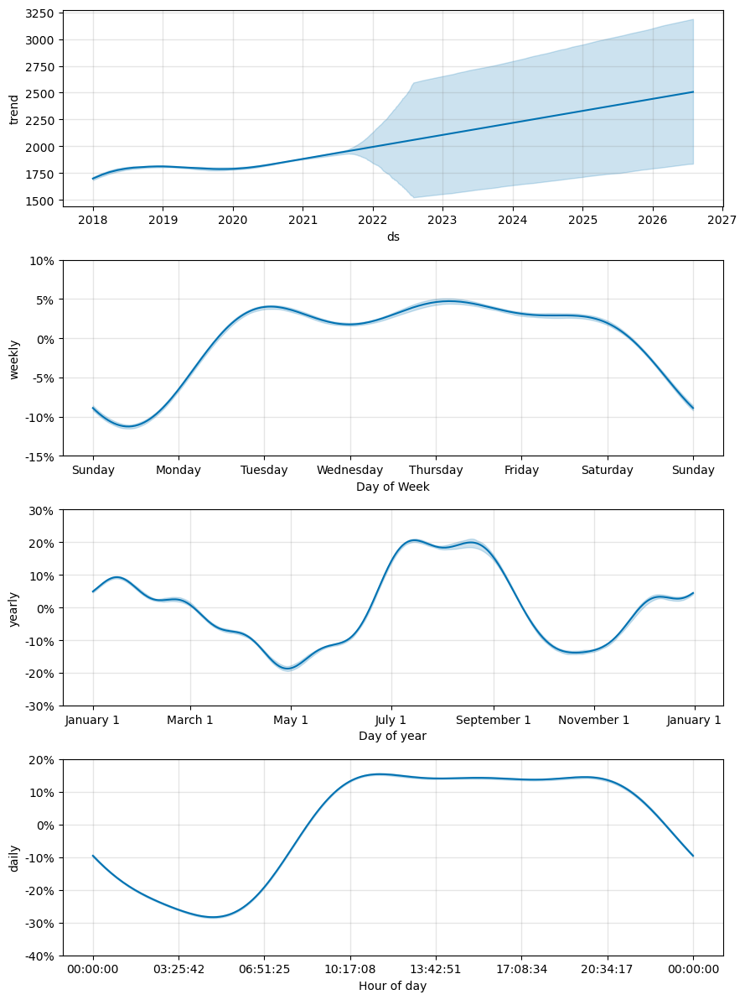

In [61]:
m = Prophet(seasonality_mode='multiplicative', mcmc_samples=50).fit(df, show_progress=False)
fcst = m.predict(future)
fig = m.plot_components(fcst)

The seasonality has low uncertainty at the start of each month where there are data points, but has very high posterior variance in between. When fitting Prophet to monthly data, only make monthly forecasts, which can be done by passing the frequency into make_future_dataframe:

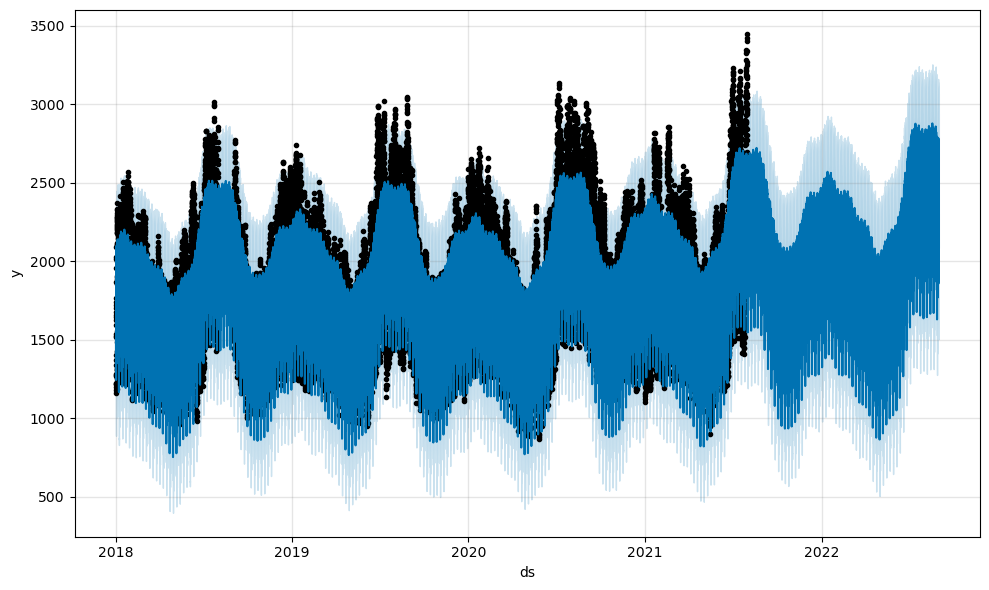

In [62]:
future = m.make_future_dataframe(periods=744, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst)

In Python, the frequency can be anything from the pandas list of frequency strings here: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases . Note that MS used here is month-start, meaning the data point is placed on the start of each month.

In monthly data, yearly seasonality can also be modeled with binary extra regressors. In particular, the model can use 12 extra regressors like is_jan, is_feb, etc. where is_jan is 1 if the date is in Jan and 0 otherwise. This approach would avoid the within-month unidentifiability seen above. Be sure to use yearly_seasonality=False if monthly extra regressors are being added.

# Holidays with Aggregated Data

Holiday effects are applied to the particular date on which the holiday was specified. With data that has been aggregated to weekly or monthly frequency, holidays that don’t fall on the particular date used in the data will be ignored: for example, a Monday holiday in a weekly time series where each data point is on a Sunday. To include holiday effects in the model, the holiday will need to be moved to the date in the history dataframe for which the effect is desired. Note that with weekly or monthly aggregated data, many holiday effects will be well-captured by the yearly seasonality, so added holidays may only be necessary for holidays that occur in different weeks throughout the time series.

# Diagnostics

## Cross Validation

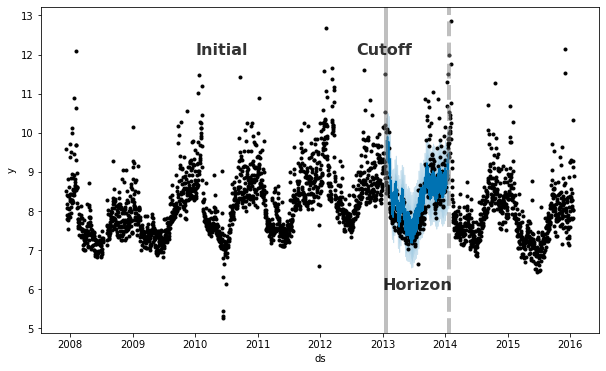

Prophet includes functionality for time series cross validation to measure forecast error using historical data. This is done by selecting cutoff points in the history, and for each of them fitting the model using data only up to that cutoff point. We can then compare the forecasted values to the actual values.

This cross validation procedure can be done automatically for a range of historical cutoffs using the cross_validation function. We specify the forecast horizon (horizon), and then optionally the size of the initial training period (initial) and the spacing between cutoff dates (period). By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

The output of cross_validation is a dataframe with the true values y and the out-of-sample forecast values yhat, at each simulated forecast date and for each cutoff date. In particular, a forecast is made for every observed point between cutoff and cutoff + horizon. This dataframe can then be used to compute error measures of yhat vs. y.

Here we do cross-validation to assess prediction performance on a horizon of 365 days, starting with 730 days of training data in the first cutoff and then making predictions every 180 days. On this 8 year time series, this corresponds to 11 total forecasts.

In [63]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')

  0%|          | 0/2 [00:00<?, ?it/s]

08:49:13 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
08:49:13 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
08:49:13 - cmdstanpy - INFO - CmdStan start processing
08:49:13 - cmdstanpy - INFO - Chain [1] start processing
08:49:13 - cmdstanpy - INFO - Chain [2] start processing
08:49:13 - cmdstanpy - INFO - Chain [3] start processing
08:49:13 - cmdstanpy - INFO - Chain [4] start processing
08:49:18 - cmdstanpy - INFO - Chain [3] done processing
08:49:19 - cmdstanpy - INFO - Chain [2] done processing
08:49:21 - cmdstanpy - INFO - Chain [1] done processing
08:49:33 - cmdstanpy - INFO - Chain [4] done processing
08:49:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

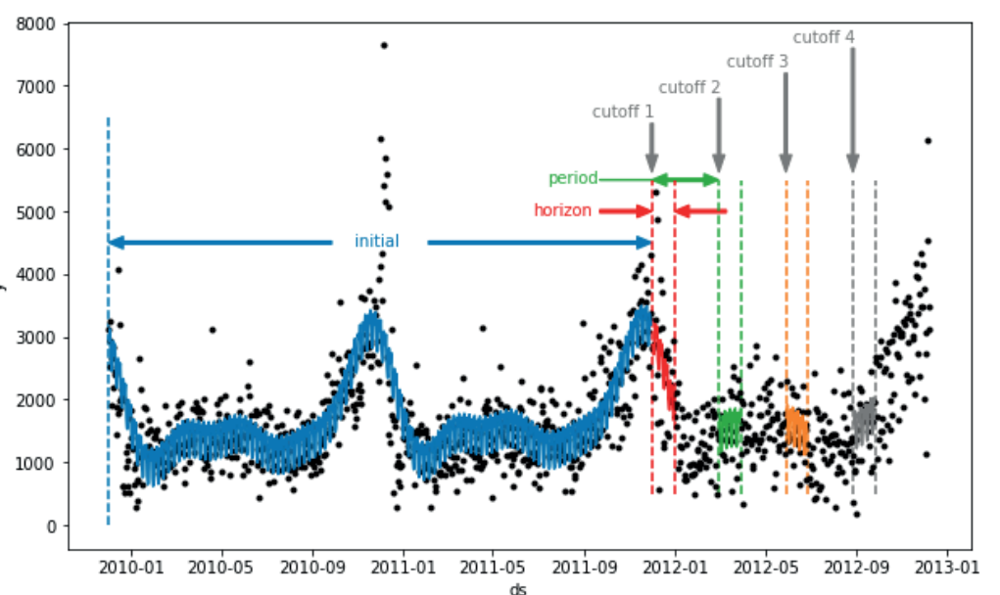

In [64]:
df['ds'].value_counts()

2018-01-01 00:00:00    1
2021-01-20 11:00:00    1
2021-01-20 04:00:00    1
2021-01-20 05:00:00    1
2021-01-20 06:00:00    1
                      ..
2019-07-12 16:00:00    1
2019-07-12 17:00:00    1
2019-07-12 18:00:00    1
2019-07-12 19:00:00    1
2022-07-31 23:00:00    1
Name: ds, Length: 40152, dtype: int64

In [65]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='942 days', period='60 days', horizon = '744 hours')

  0%|          | 0/6 [00:00<?, ?it/s]

08:49:58 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
08:49:58 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
08:49:58 - cmdstanpy - INFO - CmdStan start processing
08:49:58 - cmdstanpy - INFO - Chain [1] start processing
08:49:58 - cmdstanpy - INFO - Chain [2] start processing
08:49:58 - cmdstanpy - INFO - Chain [3] start processing
08:49:58 - cmdstanpy - INFO - Chain [4] start processing
08:50:04 - cmdstanpy - INFO - Chain [4] done processing
08:50:04 - cmdstanpy - INFO - Chain [1] done processing
08:50:05 - cmdstanpy - INFO - Chain [2] done processing
08:50:08 - cmdstanpy - INFO - Chain [3] done processing
08:50:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

In [66]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-09-03 00:00:00,1971.568007,1575.924299,2358.358543,2027.637467,2020-09-02 23:00:00
1,2020-09-03 01:00:00,1843.677799,1454.875526,2215.608424,1872.170495,2020-09-02 23:00:00
2,2020-09-03 02:00:00,1756.792234,1395.446157,2170.467708,1770.405998,2020-09-02 23:00:00
3,2020-09-03 03:00:00,1695.338087,1329.536906,2089.442171,1708.318428,2020-09-02 23:00:00
4,2020-09-03 04:00:00,1647.853998,1273.561998,2033.355628,1667.125063,2020-09-02 23:00:00


In [67]:
df_cv.tail()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
4459,2021-07-30 19:00:00,2644.054474,2369.118907,2931.858481,3061.832790,2021-06-29 23:00:00
4460,2021-07-30 20:00:00,2645.205628,2354.516086,2929.756874,3045.375184,2021-06-29 23:00:00
4461,2021-07-30 21:00:00,2601.885177,2316.170626,2885.698673,3047.092810,2021-06-29 23:00:00
4462,2021-07-30 22:00:00,2492.632044,2204.071344,2783.023388,2939.814351,2021-06-29 23:00:00
4463,2021-07-30 23:00:00,2331.767717,2046.483217,2599.259632,2802.618646,2021-06-29 23:00:00


Custom cutoffs can also be supplied as a list of dates to the cutoffs keyword in the cross_validation function in Python

In [70]:
cutoffs = pd.to_datetime(['2018-07-31', '2019-09-30', '2020-11-30'])
df_cv2 = cross_validation(m, cutoffs=cutoffs, horizon='744 hours')

  0%|          | 0/3 [00:00<?, ?it/s]

09:18:17 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
09:18:17 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
09:18:17 - cmdstanpy - INFO - CmdStan start processing
09:18:17 - cmdstanpy - INFO - Chain [1] start processing
09:18:17 - cmdstanpy - INFO - Chain [2] start processing
09:18:17 - cmdstanpy - INFO - Chain [4] start processing
09:18:17 - cmdstanpy - INFO - Chain [3] start processing
09:18:19 - cmdstanpy - INFO - Chain [2] done processing
09:18:19 - cmdstanpy - INFO - Chain [1] done processing
09:18:19 - cmdstanpy - INFO - Chain [3] done processing
09:18:20 - cmdstanpy - INFO - Chain [4] done processing
09:18:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

ValueError: Dataframe has no rows.

The performance_metrics utility can be used to compute some useful statistics of the prediction performance (yhat, yhat_lower, and yhat_upper compared to y), as a function of the distance from the cutoff (how far into the future the prediction was). The statistics computed are mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), mean absolute percent error (MAPE), median absolute percent error (MDAPE) and coverage of the yhat_lower and yhat_upper estimates. These are computed on a rolling window of the predictions in df_cv after sorting by horizon (ds minus cutoff). By default 10% of the predictions will be included in each window, but this can be changed with the rolling_window argument.

In [71]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days 03:00:00,69063.317292,262.799006,185.199983,0.099594,0.063774,0.095738,0.781764
1,3 days 04:00:00,68933.781899,262.552436,185.020183,0.099588,0.064388,0.095770,0.782511
2,3 days 05:00:00,68774.471185,262.248873,184.835199,0.099484,0.063774,0.095738,0.784006
3,3 days 06:00:00,68520.273581,261.763774,184.511737,0.099201,0.063774,0.095540,0.786248
4,3 days 07:00:00,68150.206906,261.055946,183.629109,0.098413,0.064388,0.094824,0.788490


Cross validation performance metrics can be visualized with plot_cross_validation_metric, here shown for MAPE. Dots show the absolute percent error for each prediction in df_cv. The blue line shows the MAPE, where the mean is taken over a rolling window of the dots. We see for this forecast that errors around 5% are typical for predictions one month into the future, and that errors increase up to around 11% for predictions that are a year out.

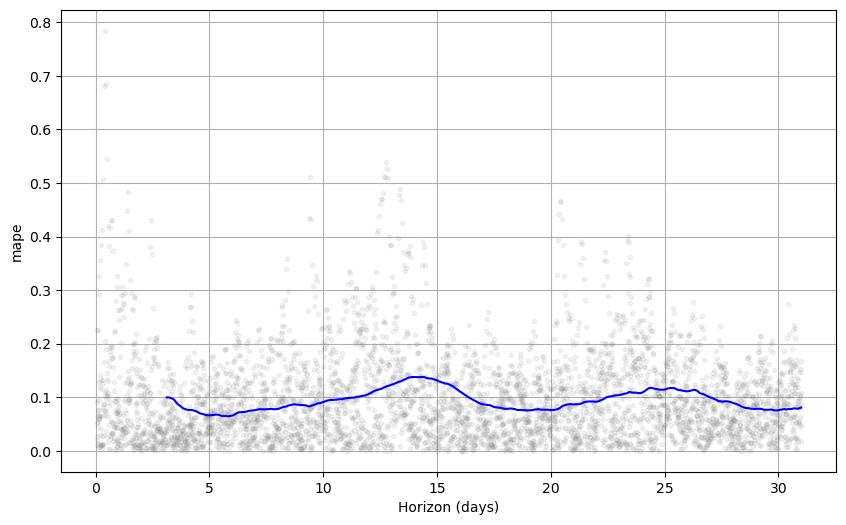

In [72]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')

The size of the rolling window in the figure can be changed with the optional argument rolling_window, which specifies the proportion of forecasts to use in each rolling window. The default is 0.1, corresponding to 10% of rows from df_cv included in each window; increasing this will lead to a smoother average curve in the figure. The initial period should be long enough to capture all of the components of the model, in particular seasonalities and extra regressors: at least a year for yearly seasonality, at least a week for weekly seasonality, etc.

# Parallelizing Cross Validation

Cross-validation can also be run in parallel mode in Python, by setting specifying the parallel keyword. Four modes are supported

parallel=None (Default, no parallelization)

parallel="processes"

parallel="threads"

parallel="dask"

For problems that aren’t too big, we recommend using parallel="processes". It will achieve the highest performance when the parallel cross validation can be done on a single machine. For large problems, a Dask cluster can be used to do the cross validation on many machines. You will need to install Dask separately, as it will not be installed with prophet.

In [73]:
from dask.distributed import Client



client = Client()  # connect to the cluster

df_cv = cross_validation(m, initial='212 days', period='365 days', horizon='744 hours',

                         parallel="dask")

09:18:35 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
09:18:35 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
09:18:35 - cmdstanpy - INFO - CmdStan start processing
09:18:35 - cmdstanpy - INFO - Chain [1] start processing
09:18:35 - cmdstanpy - INFO - Chain [2] start processing
09:18:35 - cmdstanpy - INFO - Chain [3] start processing
09:18:35 - cmdstanpy - INFO - Chain [4] start processing
09:18:39 - cmdstanpy - INFO - CmdStan installation /opt/conda/lib/python3.7/site-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
09:18:39 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
09:18:39 - cmdstanpy - INFO - CmdStan start processing
09:18:39 - cmdstanpy - INFO - Chain [1] start processing
09:18:39 - cmdstanpy - INFO - Chain [2] start processing
09:18:39 - cmdstanpy - INFO - Chain [3] start processing
09:18:39 

# Hyperparameter Tuning

Cross-validation can be used for tuning hyperparameters of the model, such as changepoint_prior_scale and seasonality_prior_scale. A Python example is given below, with a 4x4 grid of those two parameters, with parallelization over cutoffs. Here parameters are evaluated on MAPE averaged over a 30-day horizon, but different performance metrics may be appropriate for different problems.

In [74]:
import itertools
import numpy as np
import pandas as pd

param_grid = {  
    'changepoint_prior_scale': [0.1, 0.5],
    'seasonality_prior_scale': [1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, initial='212 days', period='365 days', horizon='744 hours', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    mapes.append(df_p['mape'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['mape'] = mapes
print(tuning_results)

09:19:17 - cmdstanpy - INFO - Chain [1] start processing
09:20:00 - cmdstanpy - INFO - Chain [1] done processing
09:20:03 - cmdstanpy - INFO - Chain [1] start processing
09:20:04 - cmdstanpy - INFO - Chain [1] start processing
09:20:06 - cmdstanpy - INFO - Chain [1] start processing
09:20:20 - cmdstanpy - INFO - Chain [1] done processing
09:20:32 - cmdstanpy - INFO - Chain [1] done processing
09:20:47 - cmdstanpy - INFO - Chain [1] done processing
09:20:52 - cmdstanpy - INFO - Chain [1] start processing
09:21:27 - cmdstanpy - INFO - Chain [1] done processing
09:21:30 - cmdstanpy - INFO - Chain [1] start processing
09:21:30 - cmdstanpy - INFO - Chain [1] start processing
09:21:32 - cmdstanpy - INFO - Chain [1] start processing
09:21:57 - cmdstanpy - INFO - Chain [1] done processing
09:21:59 - cmdstanpy - INFO - Chain [1] done processing
09:22:11 - cmdstanpy - INFO - Chain [1] done processing
09:22:15 - cmdstanpy - INFO - Chain [1] start processing
09:22:50 - cmdstanpy - INFO - Chain [1]

   changepoint_prior_scale  seasonality_prior_scale      mape
0                      0.1                      1.0  0.205735
1                      0.1                     10.0  0.208006
2                      0.5                      1.0  0.199835
3                      0.5                     10.0  0.207070


In [76]:
best_params = all_params[np.argmin(mapes)]
print(best_params)

{'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 1.0}


Alternatively, parallelization could be done across parameter combinations by parallelizing the loop above.

The Prophet model has a number of input parameters that one might consider tuning. Here are some general recommendations for hyperparameter tuning that may be a good starting place.

## Parameters that can be tuned

changepoint_prior_scale: This is probably the most impactful parameter. It determines the flexibility of the trend, and in particular how much the trend changes at the trend changepoints. As described in this documentation, if it is too small, the trend will be underfit and variance that should have been modeled with trend changes will instead end up being handled with the noise term. If it is too large, the trend will overfit and in the most extreme case you can end up with the trend capturing yearly seasonality. The default of 0.05 works for many time series, but this could be tuned; a range of [0.001, 0.5] would likely be about right. Parameters like this (regularization penalties; this is effectively a lasso penalty) are often tuned on a log scale.

seasonality_prior_scale: This parameter controls the flexibility of the seasonality. Similarly, a large value allows the seasonality to fit large fluctuations, a small value shrinks the magnitude of the seasonality. The default is 10., which applies basically no regularization. That is because we very rarely see overfitting here (there’s inherent regularization with the fact that it is being modeled with a truncated Fourier series, so it’s essentially low-pass filtered). A reasonable range for tuning it would probably be [0.01, 10]; when set to 0.01 you should find that the magnitude of seasonality is forced to be very small. This likely also makes sense on a log scale, since it is effectively an L2 penalty like in ridge regression.

holidays_prior_scale: This controls flexibility to fit holiday effects. Similar to seasonality_prior_scale, it defaults to 10.0 which applies basically no regularization, since we usually have multiple observations of holidays and can do a good job of estimating their effects. This could also be tuned on a range of [0.01, 10] as with seasonality_prior_scale.

seasonality_mode: Options are ['additive', 'multiplicative']. Default is 'additive', but many business time series will have multiplicative seasonality. This is best identified just from looking at the time series and seeing if the magnitude of seasonal fluctuations grows with the magnitude of the time series (see the documentation here on multiplicative seasonality), but when that isn’t possible, it could be tuned.

Maybe tune?

changepoint_range: This is the proportion of the history in which the trend is allowed to change. This defaults to 0.8, 80% of the history, meaning the model will not fit any trend changes in the last 20% of the time series. This is fairly conservative, to avoid overfitting to trend changes at the very end of the time series where there isn’t enough runway left to fit it well. With a human in the loop, this is something that can be identified pretty easily visually: one can pretty clearly see if the forecast is doing a bad job in the last 20%. In a fully-automated setting, it may be beneficial to be less conservative. It likely will not be possible to tune this parameter effectively with cross validation over cutoffs as described above. The ability of the model to generalize from a trend change in the last 10% of the time series will be hard to learn from looking at earlier cutoffs that may not have trend changes in the last 10%. So, this parameter is probably better not tuned, except perhaps over a large number of time series. In that setting, [0.8, 0.95] may be a reasonable range.

## Parameters that would likely not be tuned

growth: Options are ‘linear’ and ‘logistic’. This likely will not be tuned; if there is a known saturating point and growth towards that point it will be included and the logistic trend will be used, otherwise it will be linear.

changepoints: This is for manually specifying the locations of changepoints. None by default, which automatically places them.

n_changepoints: This is the number of automatically placed changepoints. The default of 25 should be plenty to capture the trend changes in a typical time series (at least the type that Prophet would work well on anyway). Rather than increasing or decreasing the number of changepoints, it will likely be more effective to focus on increasing or decreasing the flexibility at those trend changes, which is done with changepoint_prior_scale.

yearly_seasonality: By default (‘auto’) this will turn yearly seasonality on if there is a year of data, and off otherwise. Options are [‘auto’, True, False]. If there is more than a year of data, rather than trying to turn this off during HPO, it will likely be more effective to leave it on and turn down seasonal effects by tuning seasonality_prior_scale.

weekly_seasonality: Same as for yearly_seasonality.

daily_seasonality: Same as for yearly_seasonality.

holidays: This is to pass in a dataframe of specified holidays. The holiday effects would be tuned with holidays_prior_scale.

mcmc_samples: Whether or not MCMC is used will likely be determined by factors like the length of the time series and the importance of parameter uncertainty (these considerations are described in the documentation).

interval_width: Prophet predict returns uncertainty intervals for each component, like yhat_lower and yhat_upper for the forecast yhat. These are computed as quantiles of the posterior predictive distribution, and interval_width specifies which quantiles to use. The default of 0.8 provides an 80% prediction interval. You could change that to 0.95 if you wanted a 95% interval. This will affect only the uncertainty interval, and will not change the forecast yhat at all and so does not need to be tuned.

uncertainty_samples: The uncertainty intervals are computed as quantiles from the posterior predictive interval, and the posterior predictive interval is estimated with Monte Carlo sampling. This parameter is the number of samples to use (defaults to 1000). The running time for predict will be linear in this number. Making it smaller will increase the variance (Monte Carlo error) of the uncertainty interval, and making it larger will reduce that variance. So, if the uncertainty estimates seem jagged this could be increased to further smooth them out, but it likely will not need to be changed. As with interval_width, this parameter only affects the uncertainty intervals and changing it will not affect in any way the forecast yhat; it does not need to be tuned.

stan_backend: If both pystan and cmdstanpy backends set up, the backend can be specified. The predictions will be the same, this will not be tuned.

# Handling Shocks

As a result of the lockdowns caused by the COVID-19 pandemic, many time series experienced “shocks” during 2020, e.g. spikes in media consumption (Netflix, YouTube), e-commerce transactions (Amazon, eBay), whilst attendance to in-person events declined dramatically.

Most of these time series would also maintain their new level for a period of time, subject to fluctuations driven by easing of lockdowns and/or vaccines.

Seasonal patterns could have also changed: for example, people may have consumed less media (in total hours) on weekdays compared to weekends before the COVID lockdowns, but during lockdowns weekday consumption could be much closer to weekend consumption.

In this page we’ll explore some strategies for capturing these effects using Prophet’s functionality:

Marking step changes / spikes due to COVID events as once-off.

Sustained changes in behaviour leading to trend and seasonality changes.

In [77]:
df = pd.read_csv('/kaggle/input/gdz-elektrik-datathon-2023/train.csv')
df.rename(columns={'Tarih':'ds', 'Dağıtılan Enerji (MWh)':'y'}, inplace=True)

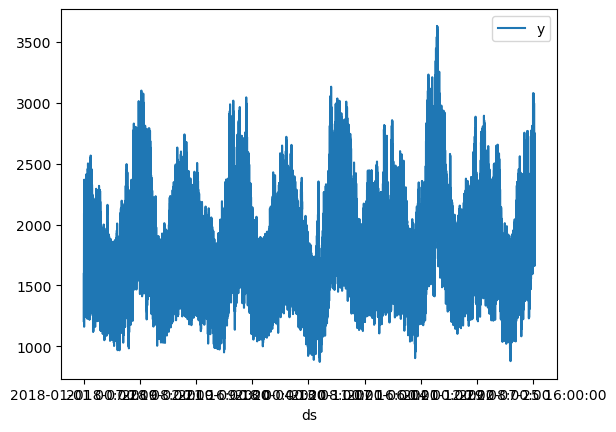

In [78]:
df.set_index('ds').plot();

Default model without any adjustments

First we’ll fit a model with the default Prophet settings:

In [79]:
m = Prophet()
m = m.fit(df)
future = m.make_future_dataframe(periods=366)
forecast = m.predict(future)

09:26:18 - cmdstanpy - INFO - Chain [1] start processing
09:26:58 - cmdstanpy - INFO - Chain [1] done processing


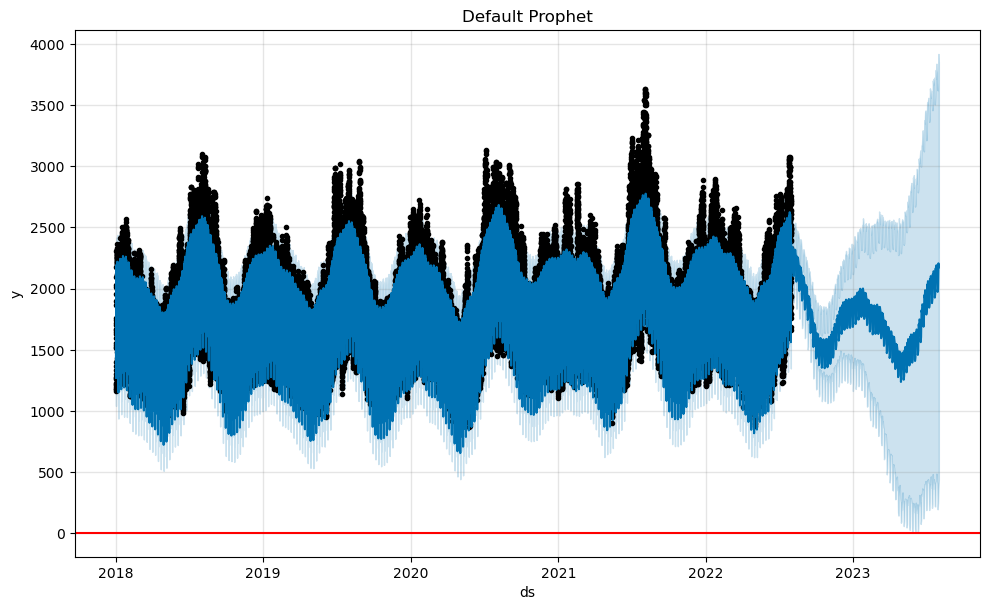

In [83]:
import matplotlib.pyplot as plt
m.plot(forecast)
plt.axhline(y=0, color='red')
plt.title('Default Prophet');

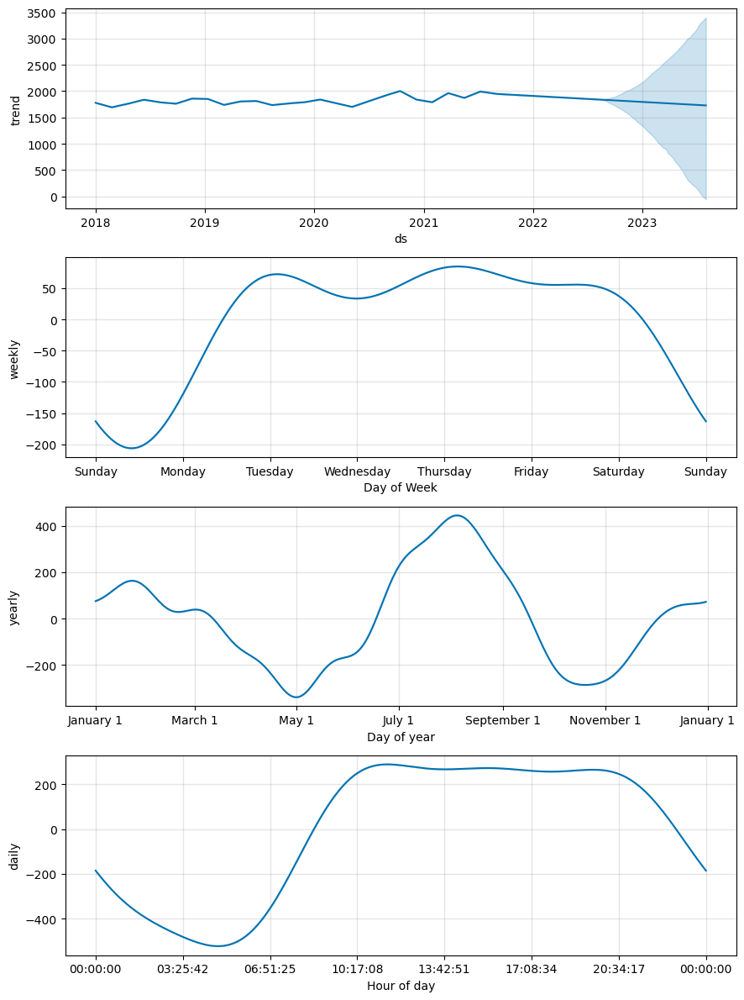

In [84]:
m.plot_components(forecast);

In [85]:
lockdowns = pd.DataFrame([
    {'holiday': 'lockdown_1', 'ds': '2020-03-21', 'lower_window': 0, 'ds_upper': '2020-06-06'},
    {'holiday': 'lockdown_2', 'ds': '2020-07-09', 'lower_window': 0, 'ds_upper': '2020-10-27'},
    {'holiday': 'lockdown_3', 'ds': '2021-02-13', 'lower_window': 0, 'ds_upper': '2021-02-17'},
    {'holiday': 'lockdown_4', 'ds': '2021-05-28', 'lower_window': 0, 'ds_upper': '2021-06-10'},
])
for t_col in ['ds', 'ds_upper']:
    lockdowns[t_col] = pd.to_datetime(lockdowns[t_col])
lockdowns['upper_window'] = (lockdowns['ds_upper'] - lockdowns['ds']).dt.days
lockdowns

,holiday,ds,lower_window,ds_upper,upper_window
0,lockdown_1,2020-03-21,0,2020-06-06,77
1,lockdown_2,2020-07-09,0,2020-10-27,110
2,lockdown_3,2021-02-13,0,2021-02-17,4
3,lockdown_4,2021-05-28,0,2021-06-10,13


In [86]:
m2 = Prophet(holidays=lockdowns)
m2 = m2.fit(df)
future2 = m2.make_future_dataframe(periods=366)
forecast2 = m2.predict(future2)

09:29:10 - cmdstanpy - INFO - Chain [1] start processing
09:31:14 - cmdstanpy - INFO - Chain [1] done processing


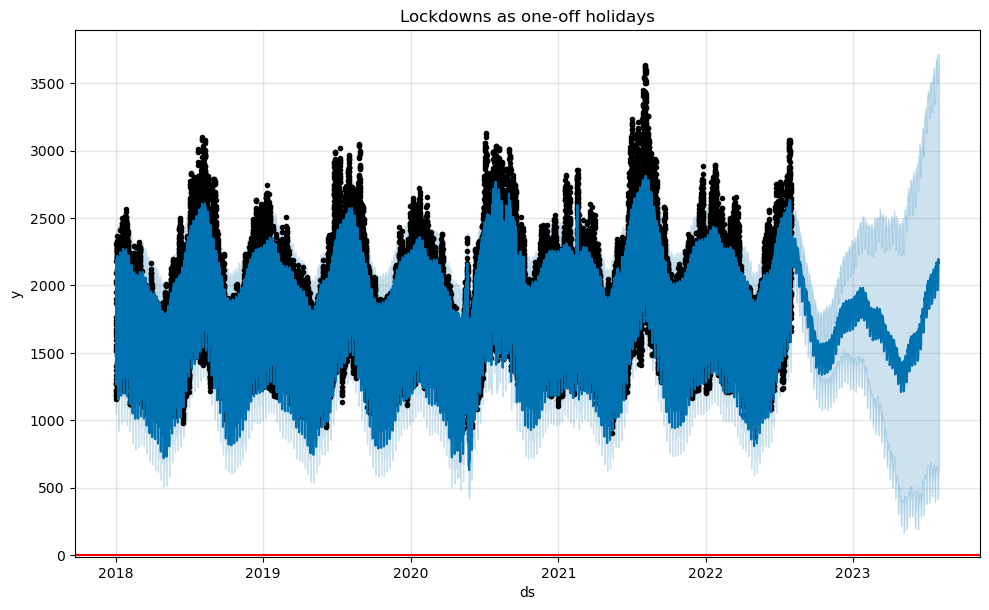

In [87]:
m2.plot(forecast2)
plt.axhline(y=0, color='red')
plt.title('Lockdowns as one-off holidays');

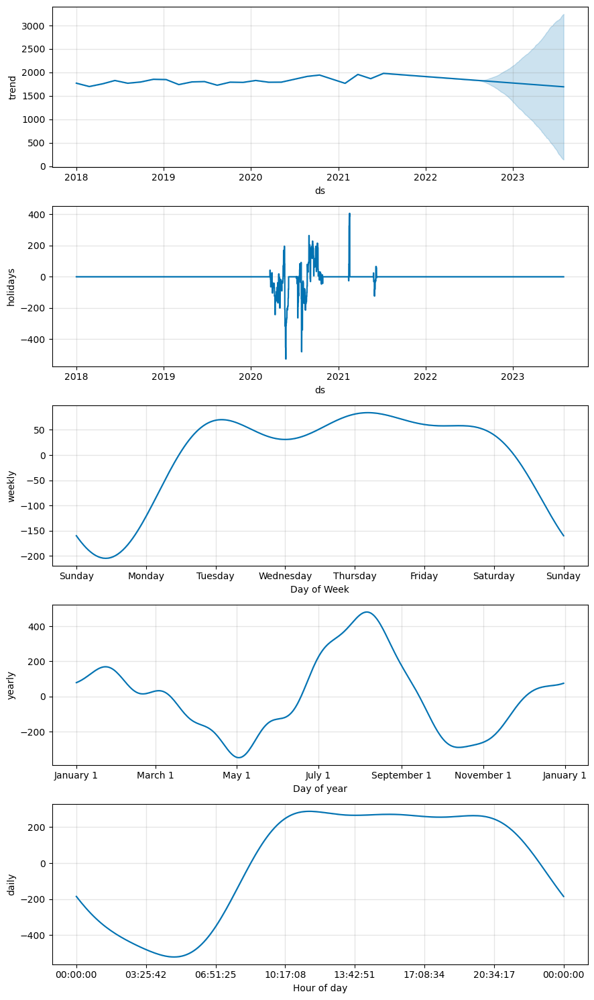

In [88]:
m2.plot_components(forecast2);

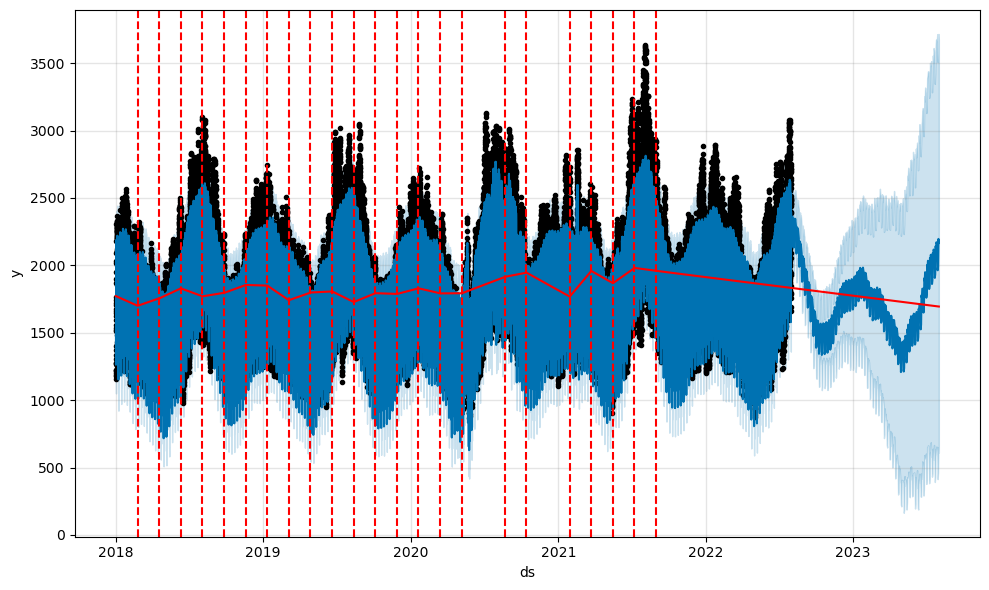

In [89]:
from prophet.plot import add_changepoints_to_plot
fig = m2.plot(forecast2)
a = add_changepoints_to_plot(fig.gca(), m2, forecast2)

In [90]:
m3_changepoints = (
    # 10 potential changepoints in 2.5 years
    pd.date_range('2018-07-31', '2020-07-31', periods=10).date.tolist() +
    # 15 potential changepoints in 1 year 2 months
    pd.date_range('2020-02-01', '2021-04-01', periods=15).date.tolist()
)

In [91]:
# Default changepoint_prior_scale is 0.05, so 1.0 will lead to much more flexibility in comparison.
m3 = Prophet(holidays=lockdowns, changepoints=m3_changepoints, changepoint_prior_scale=1.0)
m3 = m3.fit(df)
forecast3 = m3.predict(future2)

09:31:49 - cmdstanpy - INFO - Chain [1] start processing
09:35:18 - cmdstanpy - INFO - Chain [1] done processing


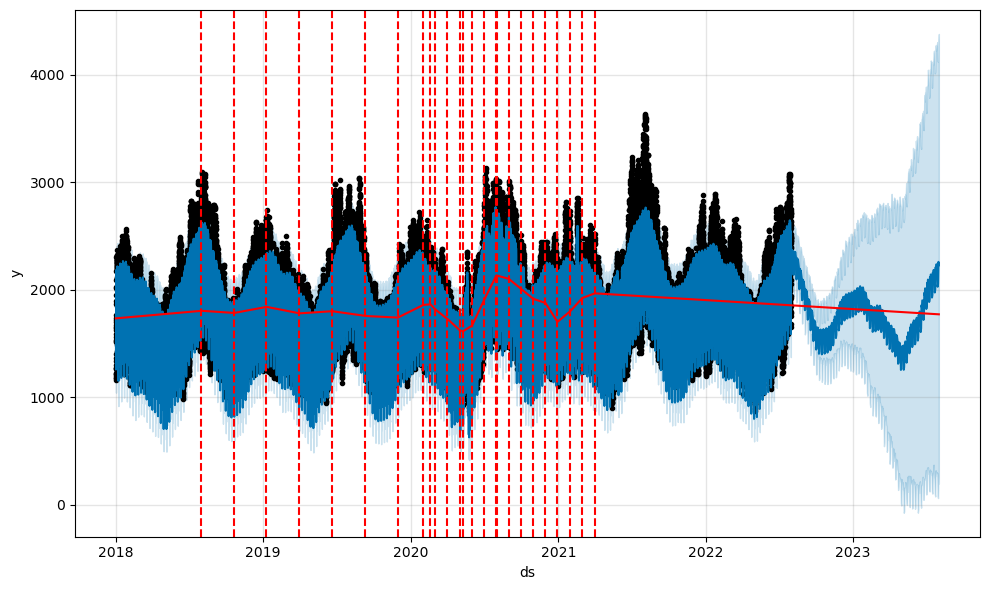

In [92]:
from prophet.plot import add_changepoints_to_plot
fig = m3.plot(forecast3)
a = add_changepoints_to_plot(fig.gca(), m3, forecast3)

In [93]:
df2 = df.copy()
df2['pre_covid'] = pd.to_datetime(df2['ds']) < pd.to_datetime('2020-03-21')
df2['post_covid'] = ~df2['pre_covid']

In [94]:
m4 = Prophet(holidays=lockdowns, weekly_seasonality=False)

In [95]:
m4.add_seasonality(
    name='weekly_pre_covid',
    period=7,
    fourier_order=3,
    condition_name='pre_covid',
)
m4.add_seasonality(
    name='weekly_post_covid',
    period=7,
    fourier_order=3,
    condition_name='post_covid',
)

In [96]:
m4 = m4.fit(df2)

09:35:49 - cmdstanpy - INFO - Chain [1] start processing
09:38:02 - cmdstanpy - INFO - Chain [1] done processing


In [97]:
future4 = m4.make_future_dataframe(periods=366)
future4['pre_covid'] = pd.to_datetime(future4['ds']) < pd.to_datetime('2020-03-21')
future4['post_covid'] = ~future4['pre_covid']

In [98]:
forecast4 = m4.predict(future4)

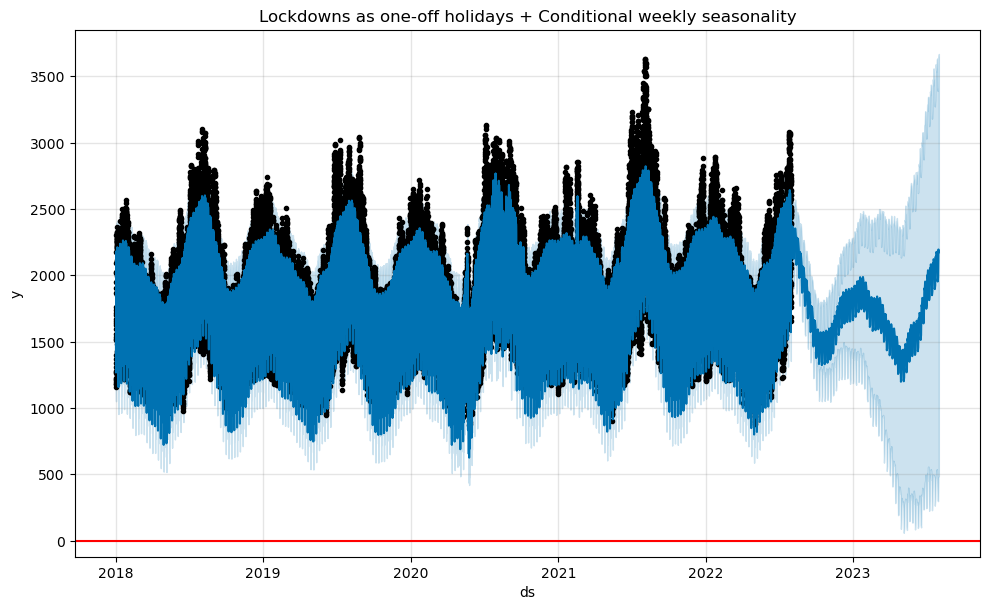

In [99]:
m4.plot(forecast4)
plt.axhline(y=0, color='red')
plt.title('Lockdowns as one-off holidays + Conditional weekly seasonality');

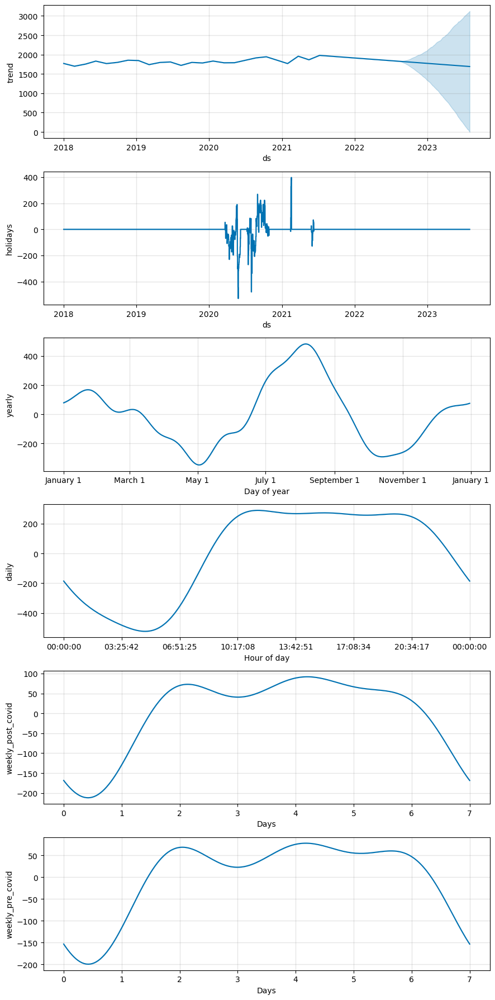

In [100]:
m4.plot_components(forecast4);

In [101]:
from prophet.serialize import model_to_json, model_from_json

with open('serialized_model.json', 'w') as fout:
    fout.write(model_to_json(m))  # Save model

with open('serialized_model.json', 'r') as fin:
    m = model_from_json(fin.read())  # Load model

In [102]:
m = Prophet(growth='flat')

In [ ]:
def warm_start_params(m):
    """
    Retrieve parameters from a trained model in the format used to initialize a new Stan model.
    Note that the new Stan model must have these same settings:
        n_changepoints, seasonality features, mcmc sampling
    for the retrieved parameters to be valid for the new model.

    Parameters
    ----------
    m: A trained model of the Prophet class.

    Returns
    -------
    A Dictionary containing retrieved parameters of m.
    """
    res = {}
    for pname in ['k', 'm', 'sigma_obs']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0][0]
        else:
            res[pname] = np.mean(m.params[pname])
    for pname in ['delta', 'beta']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0]
        else:
            res[pname] = np.mean(m.params[pname], axis=0)
    return res

df = pd.read_csv('/kaggle/input/gdz-elektrik-datathon-2023/train.csv')
df1 = df.loc[df['ds'] < '2022-07-31', :]  # All data except the last day
m1 = Prophet().fit(df1) # A model fit to all data except the last day


%timeit m2 = Prophet().fit(df)  # Adding the last day, fitting from scratch
%timeit m2 = Prophet().fit(df, init=warm_start_params(m1))  # Adding the last day, warm-starting from m1

# Kaynakça

https://facebook.github.io/prophet/docs/quick_start.html